In [274]:
import tensorflow as tf

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import pyedflib  # for EDF files
import xml.etree.ElementTree as ET  # for XML files
from lxml import etree
from scipy.stats import mode

from io import StringIO, BytesIO
import mne
import os
import glob
from collections import Counter
from sklearn.preprocessing import OneHotEncoder, StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
import copy
from scipy.stats import mode

In [3]:
# List all EDF files in the 'EDFs' folder
edf_files = glob.glob("EDF's/*.edf")

# Load the EDF files using mne (you may want to adjust this according to your needs)
edf_data = [mne.io.read_raw_edf(file, preload=True) for file in edf_files]

Extracting EDF parameters from /Users/wilsonbeckman/Documents/Python Projects/Data Scientist Projects/Sleep Cycle Detection/EDF's/shhs_polysomnography_edfs_shhs1_shhs1-204715.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 3828749  =      0.000 ... 30629.992 secs...
Extracting EDF parameters from /Users/wilsonbeckman/Documents/Python Projects/Data Scientist Projects/Sleep Cycle Detection/EDF's/shhs_polysomnography_edfs_shhs1_shhs1-202210.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 4008749  =      0.000 ... 32069.992 secs...
Extracting EDF parameters from /Users/wilsonbeckman/Documents/Python Projects/Data Scientist Projects/Sleep Cycle Detection/EDF's/shhs_polysomnography_edfs_shhs1_shhs1-200604.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 3419999  =      0.000 ... 27359.992 secs...
Extracting EDF parameters from 

EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 3371249  =      0.000 ... 26969.992 secs...
Extracting EDF parameters from /Users/wilsonbeckman/Documents/Python Projects/Data Scientist Projects/Sleep Cycle Detection/EDF's/shhs_polysomnography_edfs_shhs1_shhs1-202513.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 3596249  =      0.000 ... 28769.992 secs...
Extracting EDF parameters from /Users/wilsonbeckman/Documents/Python Projects/Data Scientist Projects/Sleep Cycle Detection/EDF's/shhs_polysomnography_edfs_shhs1_shhs1-200304.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 4001249  =      0.000 ... 32009.992 secs...
Extracting EDF parameters from /Users/wilsonbeckman/Documents/Python Projects/Data Scientist Projects/Sleep Cycle Detection/EDF's/shhs_polysomnography_edfs_shhs1_shhs1-202713.edf...
EDF file detected
Setting chann

Extracting EDF parameters from /Users/wilsonbeckman/Documents/Python Projects/Data Scientist Projects/Sleep Cycle Detection/EDF's/shhs_polysomnography_edfs_shhs1_shhs1-201104.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 3933749  =      0.000 ... 31469.992 secs...
Extracting EDF parameters from /Users/wilsonbeckman/Documents/Python Projects/Data Scientist Projects/Sleep Cycle Detection/EDF's/shhs_polysomnography_edfs_shhs1_shhs1-204915.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 4004999  =      0.000 ... 32039.992 secs...
Extracting EDF parameters from /Users/wilsonbeckman/Documents/Python Projects/Data Scientist Projects/Sleep Cycle Detection/EDF's/shhs_polysomnography_edfs_shhs1_shhs1-200804.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 3611249  =      0.000 ... 28889.992 secs...
Extracting EDF parameters from 

In [4]:
# List all XML files in the 'XMLs' folder
xml_files = glob.glob("XML's/*.xml")

# Load the XML files using xml.etree.ElementTree
xml_data = [ET.parse(file).getroot() for file in xml_files]

In [5]:
edf_files.sort()
xml_files.sort()

In [10]:
for edf, xml in zip(edf_files[:5], xml_files[:5]):
    print(f"EDF: {edf}, XML: {xml}")

EDF: EDF's/shhs_polysomnography_edfs_shhs1_shhs1-200001.edf, XML: XML's/shhs1-200001-nsrr.xml
EDF: EDF's/shhs_polysomnography_edfs_shhs1_shhs1-200101.edf, XML: XML's/shhs1-200101-nsrr.xml
EDF: EDF's/shhs_polysomnography_edfs_shhs1_shhs1-200202.edf, XML: XML's/shhs1-200202-nsrr.xml
EDF: EDF's/shhs_polysomnography_edfs_shhs1_shhs1-200304.edf, XML: XML's/shhs1-200304-nsrr.xml
EDF: EDF's/shhs_polysomnography_edfs_shhs1_shhs1-200404.edf, XML: XML's/shhs1-200404-nsrr.xml


In [14]:
# Initialize an list to hold all DF's
df_list = []

for edf_file in edf_files:
    # Load EDF file
    raw = mne.io.read_raw_edf(edf_file, preload = True, verbose = False)
    
    # Convert the data to a DataFrame
    df = raw.to_data_frame()
    
    # Append to the list
    df_list.append(df)

In [28]:
# View the first 5 rows of the first DataFrame in the list
df_list[0].columns

Index(['time', 'SaO2', 'H.R.', 'EEG(sec)', 'ECG', 'EMG', 'EOG(L)', 'EOG(R)',
       'EEG', 'THOR RES', 'ABDO RES', 'POSITION', 'LIGHT', 'NEW AIR',
       'OX stat'],
      dtype='object')

In [29]:
cols_to_keep = ['time', 'SaO2', 'H.R.', 'POSITION']
df_list = [df[cols_to_keep] for df in df_list]

In [53]:
df_list[0].tail()

,time,SaO2,H.R.,POSITION
4064995,32519.960,1525.90219,3814.755474,3000000.0
4064996,32519.968,1525.90219,3814.755474,3000000.0
4064997,32519.976,1525.90219,3814.755474,3000000.0
4064998,32519.984,1525.90219,3814.755474,3000000.0
4064999,32519.992,1525.90219,3814.755474,3000000.0


In [40]:
import gc

gc.collect()

1561

In [49]:
def parse_sleep_stages(xml_file, edf_length):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    
    sleep_stage = []
    start_times = []
    durations = []
    
    # Extract the sleep stages and corresponding start times and durations from the xml
    for event in root.iter('ScoredEvent'):
        event_type = event.find('EventType').text
        if event_type == 'Stages|Stages':
            sleep_stage.append(event.find('EventConcept').text)
            start_times.append(float(event.find('Start').text))
            durations.append(float(event.find('Duration').text))
            
    # Convert the start times and durations to the same time scale as your edf
    start_times = np.array(start_times) / 0.008
    durations = np.array(durations) / 0.008
    
    # Create an array of the same length as your edf
    labels = np.empty(edf_length, dtype=object)
    
    #Fill in the sleep stages in the array
    start_index = 0
    for sleep_stage, duration in zip(sleep_stage, durations):
        end_index = start_index + int(duration)
        labels[start_index:end_index] = sleep_stage
        start_index = end_index
    
    return labels

In [50]:
labels_list = []
for xml_file, df in zip(xml_files, df_list):
    labels = parse_sleep_stages(xml_file, len(df))
    labels_list.append(labels)

In [56]:
labels_list[56]

array(['Wake|0', 'Wake|0', 'Wake|0', ..., 'Wake|0', 'Wake|0', 'Wake|0'],
      dtype=object)

In [57]:
import numpy as np

# Initialize a list to store percentages
percentages_list = []

# Loop over the labels_list
for labels in labels_list:
    # Use Counter to count the frequency of each label
    counter = Counter(labels)

    # Calculate the total number of labels
    total = len(labels)

    # Create a dictionary to store the percentage for each label
    percentages = {stage: count/total*100 for stage, count in counter.items()}

    # Append the percentages dictionary to the percentages_list
    percentages_list.append(percentages)

# Print the percentages_list
for i, percentages in enumerate(percentages_list):
    print(f"EDF File {i+1}:")
    for stage, percentage in percentages.items():
        print(f"{stage}: {percentage}%")
    print("\n")

EDF File 1:
Wake|0: 30.719557195571955%
Stage 1 sleep|1: 4.3357933579335795%
Stage 2 sleep|2: 42.15867158671587%
Stage 3 sleep|3: 13.376383763837637%
REM sleep|5: 9.40959409594096%


EDF File 2:
Wake|0: 12.351543942992874%
Stage 1 sleep|1: 4.156769596199525%
Stage 2 sleep|2: 52.37529691211401%
Stage 3 sleep|3: 11.63895486935867%
REM sleep|5: 19.358669833729216%
Unscored|9: 0.11876484560570072%


EDF File 3:
Wake|0: 45.27595884003742%
Stage 2 sleep|2: 54.724041159962574%


EDF File 4:
Wake|0: 55.38894095595126%
Stage 1 sleep|1: 2.530459231490159%
Stage 2 sleep|2: 34.02061855670103%
Stage 3 sleep|3: 0.4686035613870665%
REM sleep|5: 7.591377694470477%


EDF File 5:
Wake|0: 22.88698955365622%
Stage 1 sleep|1: 2.2792022792022792%
Stage 2 sleep|2: 33.61823361823362%
Stage 3 sleep|3: 21.74738841405508%
Stage 4 sleep|4: 10.0664767331434%
REM sleep|5: 9.401709401709402%


EDF File 6:
Wake|0: 24.043179587831208%
Stage 1 sleep|1: 2.4533856722276743%
Stage 2 sleep|2: 37.88027477919529%
Stage 3 sle

In [58]:
unscored_indices = [1, 52]  # indices of the files you want to remove
df_list = [df for i, df in enumerate(df_list) if i not in unscored_indices]
labels_list = [labels for i, labels in enumerate(labels_list) if i not in unscored_indices]

In [59]:
for idx, labels in enumerate(labels_list):
    sleep_stage_counter = Counter(labels)
    total_time_points = sum(sleep_stage_counter.values())
    print(f"File {idx+1}:")
    for stage, count in sleep_stage_counter.items():
        percentage = (count / total_time_points) * 100
        print(f"{stage}: {percentage:.2f}%")
    print("\n")

File 1:
Wake|0: 30.72%
Stage 1 sleep|1: 4.34%
Stage 2 sleep|2: 42.16%
Stage 3 sleep|3: 13.38%
REM sleep|5: 9.41%


File 2:
Wake|0: 45.28%
Stage 2 sleep|2: 54.72%


File 3:
Wake|0: 55.39%
Stage 1 sleep|1: 2.53%
Stage 2 sleep|2: 34.02%
Stage 3 sleep|3: 0.47%
REM sleep|5: 7.59%


File 4:
Wake|0: 22.89%
Stage 1 sleep|1: 2.28%
Stage 2 sleep|2: 33.62%
Stage 3 sleep|3: 21.75%
Stage 4 sleep|4: 10.07%
REM sleep|5: 9.40%


File 5:
Wake|0: 24.04%
Stage 1 sleep|1: 2.45%
Stage 2 sleep|2: 37.88%
Stage 3 sleep|3: 24.63%
REM sleep|5: 10.99%


File 6:
Wake|0: 33.44%
Stage 1 sleep|1: 1.75%
Stage 2 sleep|2: 36.84%
Stage 3 sleep|3: 11.84%
REM sleep|5: 16.12%


File 7:
Wake|0: 10.73%
Stage 1 sleep|1: 0.95%
Stage 2 sleep|2: 32.42%
Stage 3 sleep|3: 44.93%
REM sleep|5: 10.97%


File 8:
Wake|0: 31.15%
Stage 1 sleep|1: 3.32%
Stage 2 sleep|2: 41.64%
Stage 3 sleep|3: 9.66%
REM sleep|5: 14.23%


File 9:
Wake|0: 15.90%
Stage 1 sleep|1: 5.89%
Stage 2 sleep|2: 39.06%
Stage 3 sleep|3: 23.06%
Stage 4 sleep|4: 1.67%
REM

In [182]:
# Resetting the index for all dataframes in df_list
for i, df in enumerate(df_list):
    df.reset_index(inplace=True)
    df_list[i] = df

In [184]:
# Dropping the 'POSITION_shifted' column for all dataframes in df_list
for i, df in enumerate(df_list):
    if 'POSITION_shifted' in df.columns:
        df.drop(columns=['POSITION_shifted'], inplace=True)
        df_list[i] = df

In [194]:
resampled_df_list = []
for i, df in enumerate(df_list):
    # Create a 'time' column
    df['time'] = np.arange(0, len(df) * 0.008, 0.008)
    
    # Convert 'time' column to datetime, considering it as seconds
    df['time'] = pd.to_datetime(df['time'], unit='s')

    # Set 'time' as the index for resampling
    df.set_index('time', inplace=True)

    # Resample to 1-second intervals. Take the mean of 'SaO2' and 'H.R.' columns, 
    # and the mode of 'POSITION' and 'label' columns.
    df_resampled = df.resample('1S').agg({'SaO2': 'mean', 'H.R.': 'mean', 'POSITION': lambda x: x.mode()[0] if len(x.mode()) else np.nan, 'label': lambda x: x.mode()[0] if len(x.mode()) else np.nan})

    # Reset the index
    df_resampled.reset_index(inplace=True)

    resampled_df_list.append(df_resampled)

In [197]:
for df in resampled_df_list:
    # Filter the dataframe for only "Wake" stages
    df_wake = df[df['label'].str.contains('Wake')]

    # Get the start time of the last wake period
    last_wake_start_time = df_wake.iloc[-1]['time']

    # Calculate the end time 5 minutes after waking up
    last_wake_end_time = last_wake_start_time + pd.Timedelta(minutes=5)

    # Create a new dataframe for the first 5 minutes after the last wake up
    df_first_5_mins = df[(df['time'] >= last_wake_start_time) & (df['time'] <= last_wake_end_time)]

    # Calculate the average HR during the first 5 minutes after waking up
    baseline_HR = df_first_5_mins['H.R.'].mean()

    # Create a new column for baseline HR deviation
    df['baseline_HR_deviation'] = df['H.R.'] - baseline_HR

In [199]:
# Dropping the 'POSITION_shifted' column for all dataframes in df_list
for i, df in enumerate(resampled_df_list):
    if 'baseline_HR_deviation' in df.columns:
        df.drop(columns=['baseline_HR_deviation'], inplace=True)
        resampled_df_list[i] = df

In [200]:
resampled_df_list[0].head()

,time,SaO2,H.R.,POSITION,label
0,1970-01-01 00:00:00,9.531243e+07,7.734417e+07,2000000.0,Wake|0
1,1970-01-01 00:00:01,9.531243e+07,7.734417e+07,2000000.0,Wake|0
2,1970-01-01 00:00:02,9.531243e+07,7.734417e+07,2000000.0,Wake|0
3,1970-01-01 00:00:03,9.531243e+07,7.656596e+07,2000000.0,Wake|0
4,1970-01-01 00:00:04,9.531243e+07,7.656596e+07,2000000.0,Wake|0


In [201]:
window_size = 60  # choose your window size

for df in resampled_df_list:
    # Moving averages
    df['HR_moving_avg'] = df['H.R.'].rolling(window=window_size).mean()
    df['SaO2_moving_avg'] = df['SaO2'].rolling(window=window_size).mean()

    # Standard deviations
    df['HR_std'] = df['H.R.'].rolling(window=window_size).std()
    df['SaO2_std'] = df['SaO2'].rolling(window=window_size).std()

    # Differences between consecutive measurements
    df['HR_diff'] = df['H.R.'].diff()
    df['SaO2_diff'] = df['SaO2'].diff()

    # HR/SaO2 ratio
    df['HR_SaO2_ratio'] = df['H.R.'] / df['SaO2']

    # Position change counts
    df['Position_change'] = df['POSITION'].diff()
    df['Position_change_count'] = df['Position_change'].rolling(window=window_size).apply(lambda x: np.sum(x != 0), raw=True)

    # Features based on time (you need to define sleep_start_time and wake_up_time)
    # df['time_of_day'] = df['time'].dt.hour
    # df['time_elapsed_since_sleep_start'] = df['time'] - sleep_start_time
    # df['time_to_wake_up'] = wake_up_time - df['time']

    # HRV (requires individual heart beat times)
    # df['HRV'] = calculate_HRV(df['heartbeat_times'])

In [209]:
# Define a function to calculate HRV approximation
def calculate_HRV(df):
    # Calculate standard deviation of HR over a 60-second window
    df['HRV'] = df['H.R.'].rolling(window=60).std()
    return df

# Apply the function to each DataFrame in the list
resampled_df_list = [calculate_HRV(df) for df in resampled_df_list]

In [217]:
# Define a function to one-hot encode POSITION
def encode_POSITION(df):
    # Use pd.get_dummies to convert 'POSITION' into one-hot encoding
    position_dummies = pd.get_dummies(df['POSITION'], prefix='POSITION')
    
    # Drop the original 'POSITION' column
    df = df.drop(columns='POSITION')
    
    # Concatenate the original DataFrame with the new 'POSITION' columns
    df = pd.concat([df, position_dummies], axis=1)
    return df

# Apply the function to each DataFrame in the list
resampled_df_list = [encode_POSITION(df) for df in resampled_df_list]

In [218]:
resampled_df_list[0].head()

,time,SaO2,H.R.,label,HR_moving_avg,SaO2_moving_avg,HR_std,SaO2_std,HR_diff,SaO2_diff,HR_SaO2_ratio,Position_change,Position_change_count,HRV,POSITION_0.0,POSITION_1000000.0,POSITION_2000000.0,POSITION_3000000.0
0,1970-01-01 00:00:00,9.531243e+07,7.734417e+07,Wake|0,NaN,NaN,NaN,NaN,NaN,NaN,0.811480,NaN,NaN,NaN,0,0,1,0
1,1970-01-01 00:00:01,9.531243e+07,7.734417e+07,Wake|0,NaN,NaN,NaN,NaN,0.000000,0.0,0.811480,0.0,NaN,NaN,0,0,1,0
2,1970-01-01 00:00:02,9.531243e+07,7.734417e+07,Wake|0,NaN,NaN,NaN,NaN,0.000000,0.0,0.811480,0.0,NaN,NaN,0,0,1,0
3,1970-01-01 00:00:03,9.531243e+07,7.656596e+07,Wake|0,NaN,NaN,NaN,NaN,-778210.116732,0.0,0.803316,0.0,NaN,NaN,0,0,1,0
4,1970-01-01 00:00:04,9.531243e+07,7.656596e+07,Wake|0,NaN,NaN,NaN,NaN,0.000000,0.0,0.803316,0.0,NaN,NaN,0,0,1,0


In [224]:
resampled_df_list[0].head()

,time,SaO2,H.R.,label,HR_moving_avg,SaO2_moving_avg,HR_std,SaO2_std,HR_diff,SaO2_diff,HR_SaO2_ratio,Position_change,Position_change_count,HRV,POSITION_0.0,POSITION_1000000.0,POSITION_2000000.0,POSITION_3000000.0
0,1970-01-01 00:00:00,9.531243e+07,7.734417e+07,Wake|0,5.932141e+07,7.950504e+07,3.112389e+06,1.756273e+06,-2378.312755,-2930.929689,0.811480,30.751253,0.349353,3.112389e+06,0,0,1,0
1,1970-01-01 00:00:01,9.531243e+07,7.734417e+07,Wake|0,5.932141e+07,7.950504e+07,3.112389e+06,1.756273e+06,0.000000,0.000000,0.811480,0.000000,0.349353,3.112389e+06,0,0,1,0
2,1970-01-01 00:00:02,9.531243e+07,7.734417e+07,Wake|0,5.932141e+07,7.950504e+07,3.112389e+06,1.756273e+06,0.000000,0.000000,0.811480,0.000000,0.349353,3.112389e+06,0,0,1,0
3,1970-01-01 00:00:03,9.531243e+07,7.656596e+07,Wake|0,5.932141e+07,7.950504e+07,3.112389e+06,1.756273e+06,-778210.116732,0.000000,0.803316,0.000000,0.349353,3.112389e+06,0,0,1,0
4,1970-01-01 00:00:04,9.531243e+07,7.656596e+07,Wake|0,5.932141e+07,7.950504e+07,3.112389e+06,1.756273e+06,0.000000,0.000000,0.803316,0.000000,0.349353,3.112389e+06,0,0,1,0


               SaO2          H.R.  HR_moving_avg  SaO2_moving_avg  \
count  3.252000e+04  3.252000e+04   3.252000e+04     3.252000e+04   
mean   7.944664e+07  5.927986e+07   5.932141e+07     7.950504e+07   
std    3.309599e+07  2.527809e+07   2.432956e+07     3.236023e+07   
min    1.525902e+03  3.814755e+03   3.814755e+03     1.525902e+03   
25%    9.101549e+07  6.328298e+07   6.372535e+07     9.128901e+07   
50%    9.335927e+07  6.718929e+07   6.721542e+07     9.331370e+07   
75%    9.414054e+07  7.265965e+07   7.257986e+07     9.393220e+07   
max    9.804532e+07  1.671855e+08   9.613546e+07     9.658836e+07   

             HR_std      SaO2_std       HR_diff     SaO2_diff  HR_SaO2_ratio  \
count  3.252000e+04  3.252000e+04  3.252000e+04  3.252000e+04   32520.000000   
mean   3.112389e+06  1.756273e+06 -2.378313e+03 -2.930930e+03       2.894472   
std    5.894559e+06  6.313296e+06  3.350965e+06  3.541797e+06     340.697984   
min    0.000000e+00  0.000000e+00 -9.452964e+07 -9.726406e

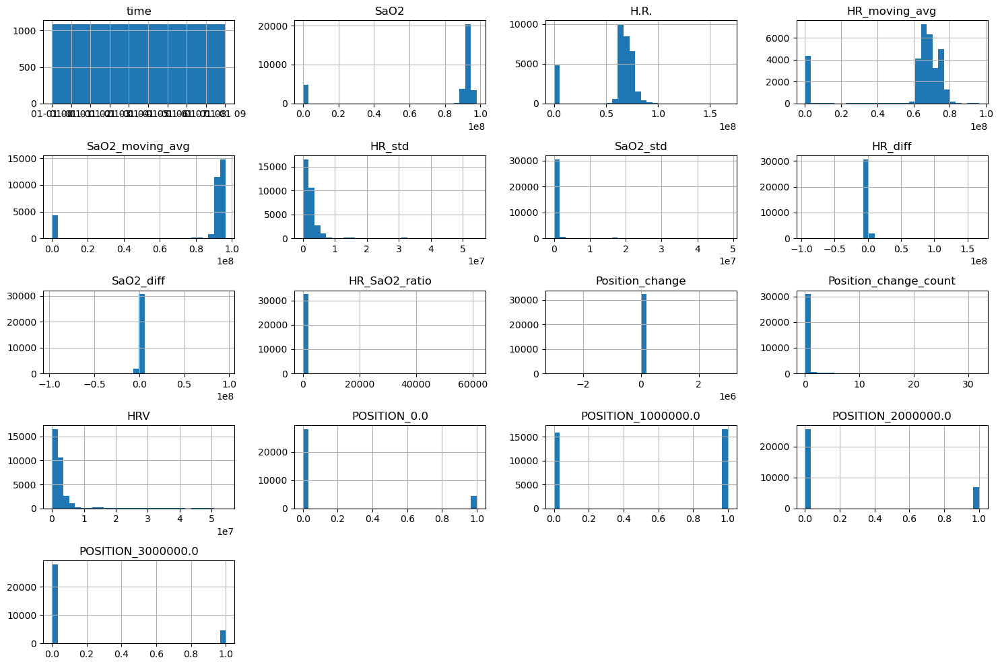

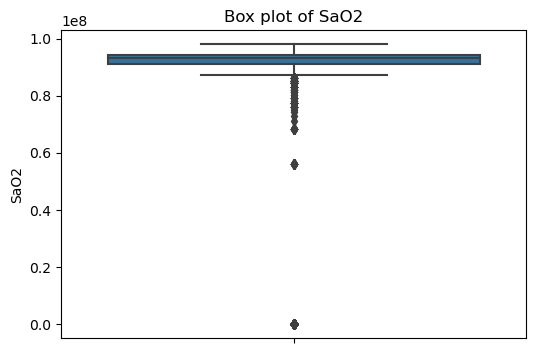

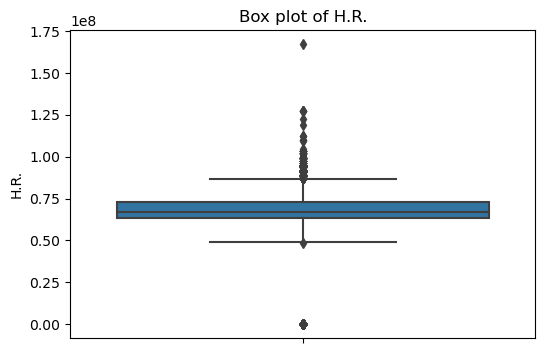

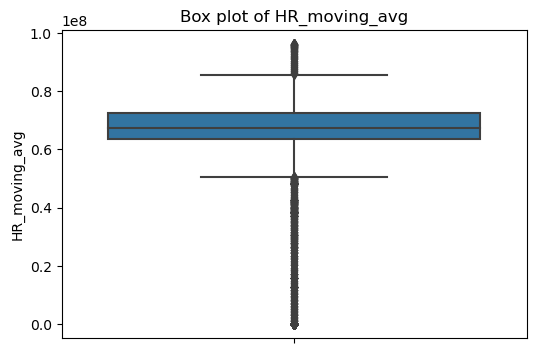

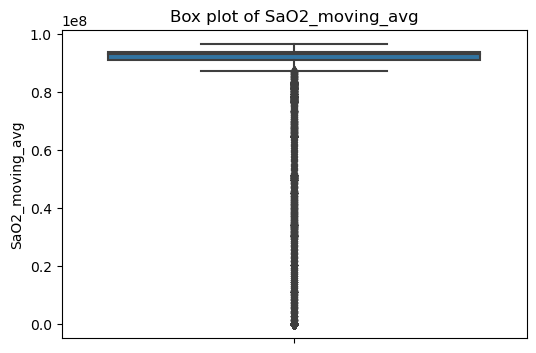

...

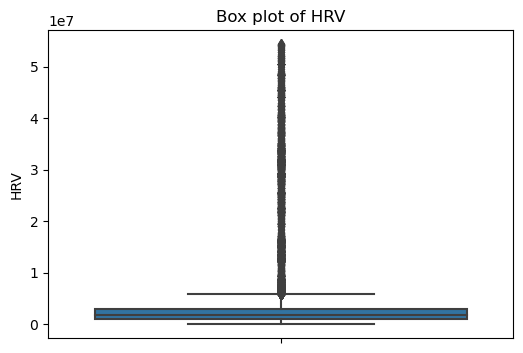

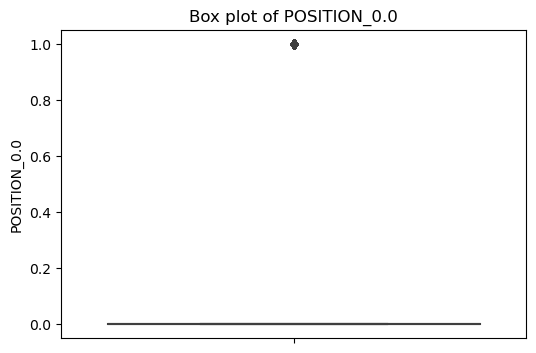

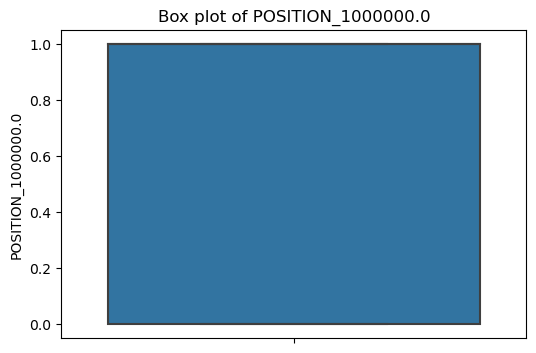

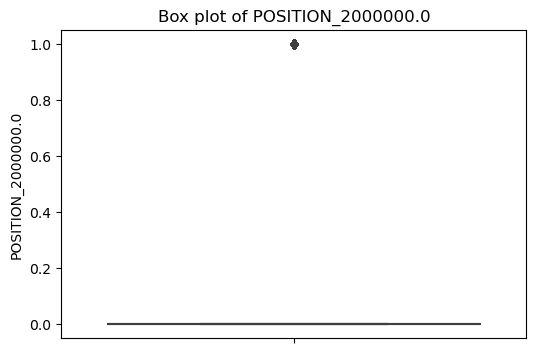

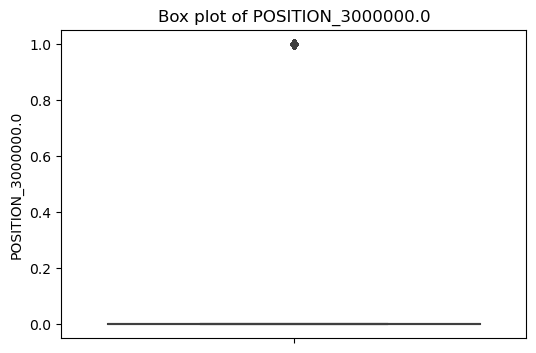

/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/3819315205.py:32: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


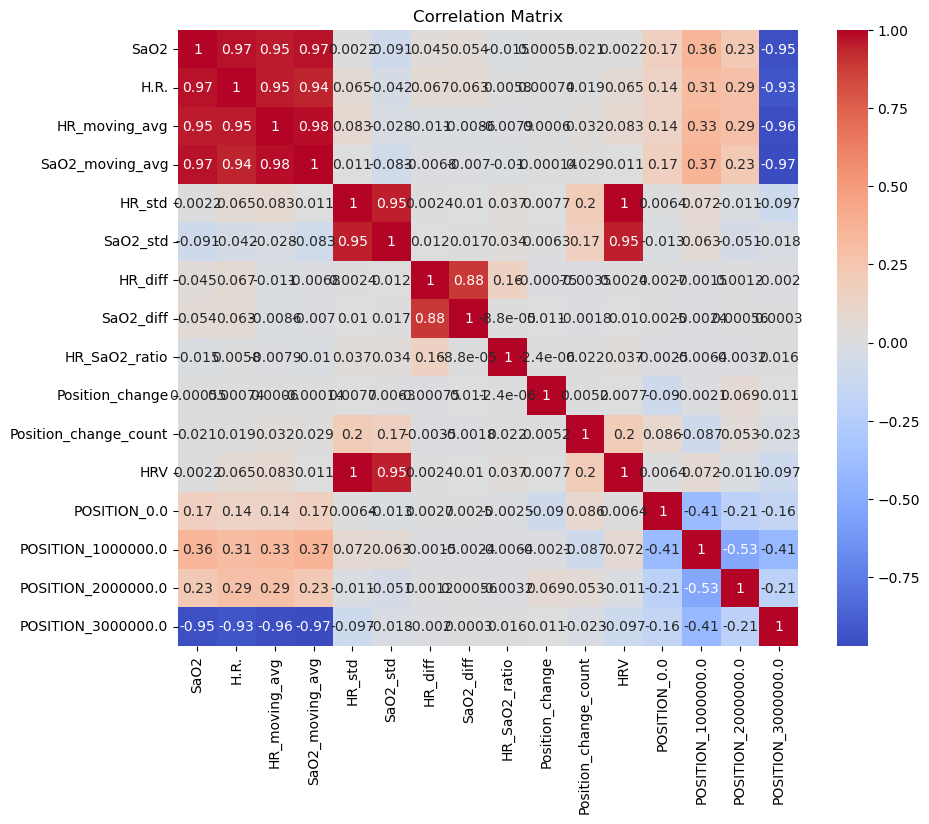

In [225]:
# Suppose df is one of your DataFrames
df = resampled_df_list[0]  # replace with the appropriate index

# Get a quick overview of the data
print(df.describe())

# Check if there are any missing values
print(df.isnull().sum())

# Handle NaN values - we replace NaNs with the mean of the column
for col in df.columns:
    if df[col].dtype == np.float64 or df[col].dtype == np.int64:
        df[col].fillna(df[col].mean(), inplace=True)

# Histograms of numeric features
df.hist(bins=30, figsize=(15, 10))
plt.tight_layout()
plt.show()

# Box plots for numeric features
numeric_features = ['SaO2', 'H.R.', 'HR_moving_avg', 'SaO2_moving_avg',
       'HR_std', 'SaO2_std', 'HR_diff', 'SaO2_diff', 'HR_SaO2_ratio',
       'Position_change', 'Position_change_count', 'HRV', 'POSITION_0.0',
       'POSITION_1000000.0', 'POSITION_2000000.0', 'POSITION_3000000.0']  # add more if needed
for feature in numeric_features:
    plt.figure(figsize=(6, 4))
    sns.boxplot(y=df[feature])
    plt.title(f'Box plot of {feature}')
    plt.show()

# Correlation matrix
corr_matrix = df.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

In [226]:
# Drop 'HR_std' column in each DataFrame
for df in resampled_df_list:
    df.drop('HR_std', axis=1, inplace=True)

In [227]:
resampled_df_list[0].head()

,time,SaO2,H.R.,label,HR_moving_avg,SaO2_moving_avg,SaO2_std,HR_diff,SaO2_diff,HR_SaO2_ratio,Position_change,Position_change_count,HRV,POSITION_0.0,POSITION_1000000.0,POSITION_2000000.0,POSITION_3000000.0
0,1970-01-01 00:00:00,9.531243e+07,7.734417e+07,Wake|0,5.932141e+07,7.950504e+07,1.756273e+06,-2378.312755,-2930.929689,0.811480,30.751253,0.349353,3.112389e+06,0,0,1,0
1,1970-01-01 00:00:01,9.531243e+07,7.734417e+07,Wake|0,5.932141e+07,7.950504e+07,1.756273e+06,0.000000,0.000000,0.811480,0.000000,0.349353,3.112389e+06,0,0,1,0
2,1970-01-01 00:00:02,9.531243e+07,7.734417e+07,Wake|0,5.932141e+07,7.950504e+07,1.756273e+06,0.000000,0.000000,0.811480,0.000000,0.349353,3.112389e+06,0,0,1,0
3,1970-01-01 00:00:03,9.531243e+07,7.656596e+07,Wake|0,5.932141e+07,7.950504e+07,1.756273e+06,-778210.116732,0.000000,0.803316,0.000000,0.349353,3.112389e+06,0,0,1,0
4,1970-01-01 00:00:04,9.531243e+07,7.656596e+07,Wake|0,5.932141e+07,7.950504e+07,1.756273e+06,0.000000,0.000000,0.803316,0.000000,0.349353,3.112389e+06,0,0,1,0


/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


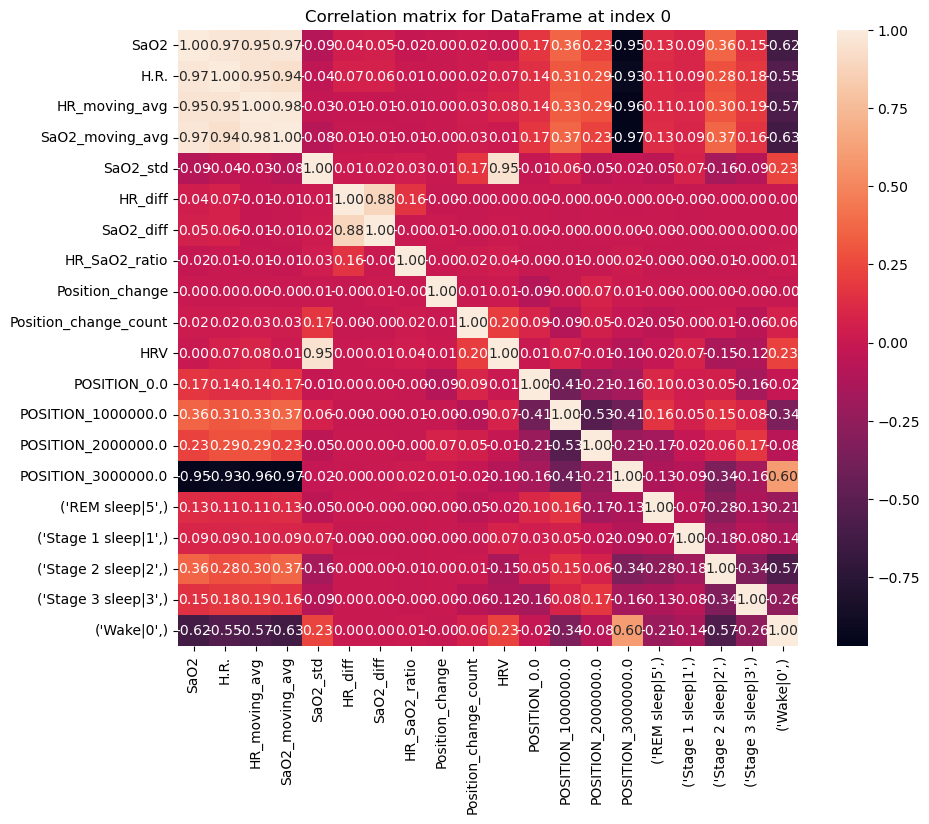

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


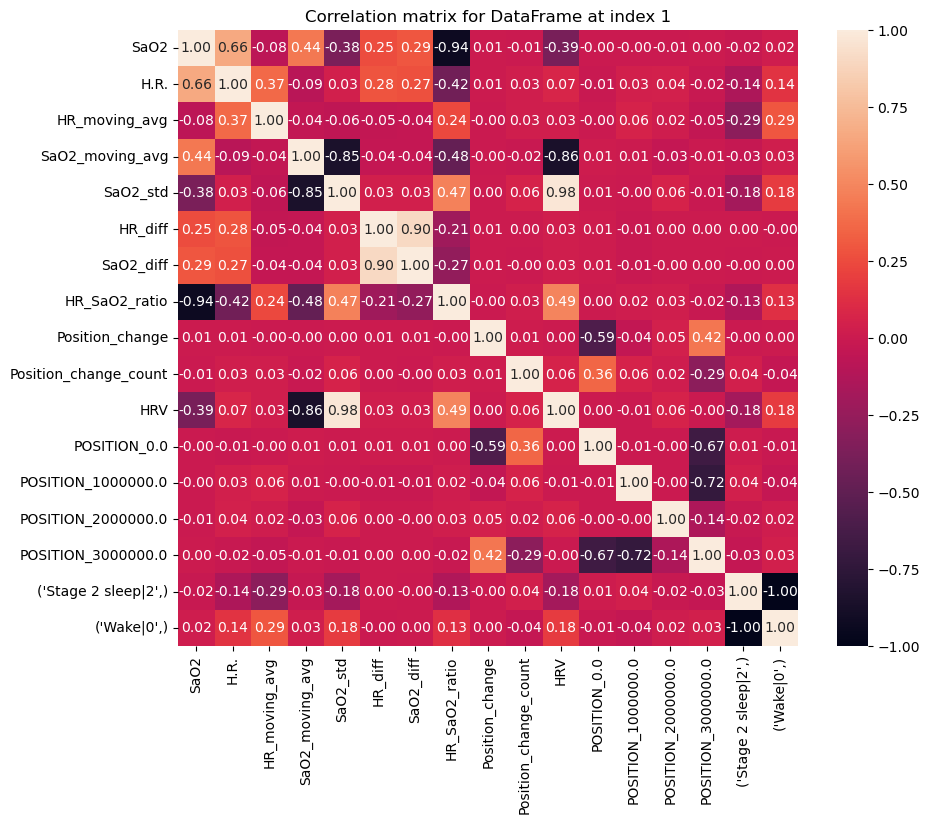

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


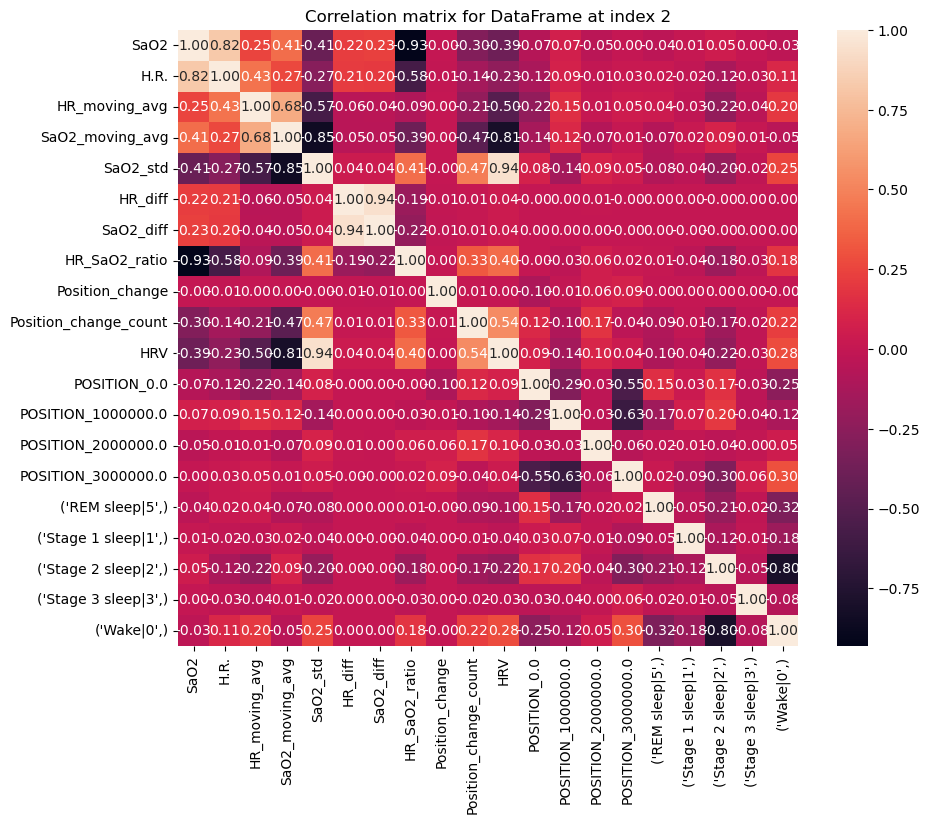

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


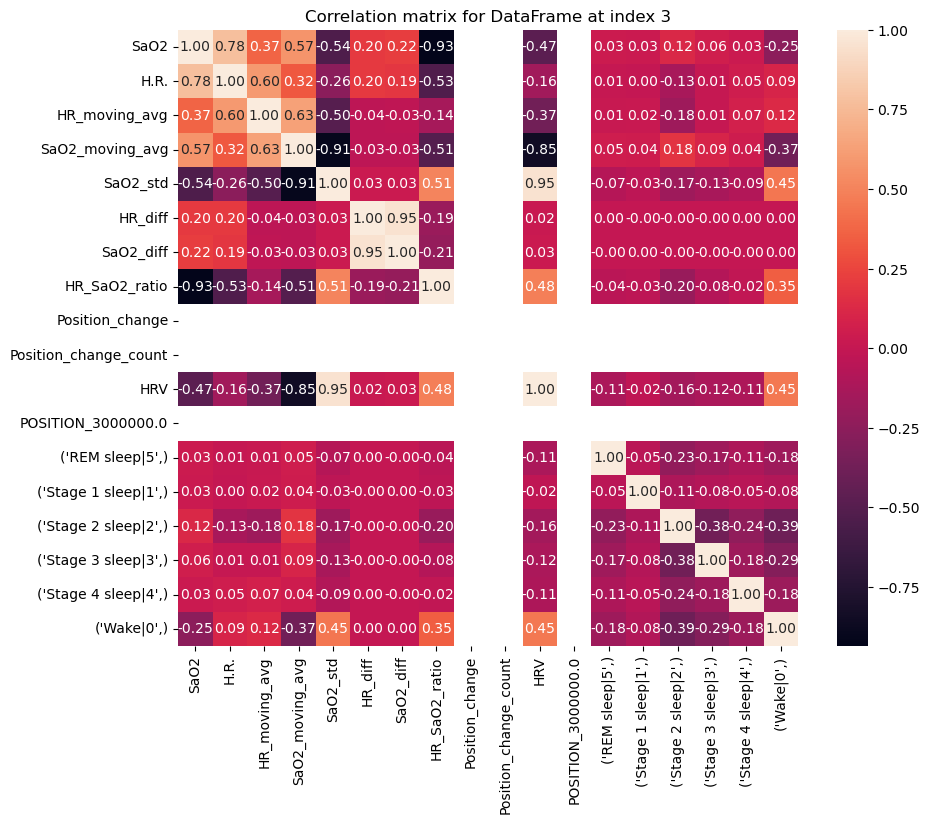

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


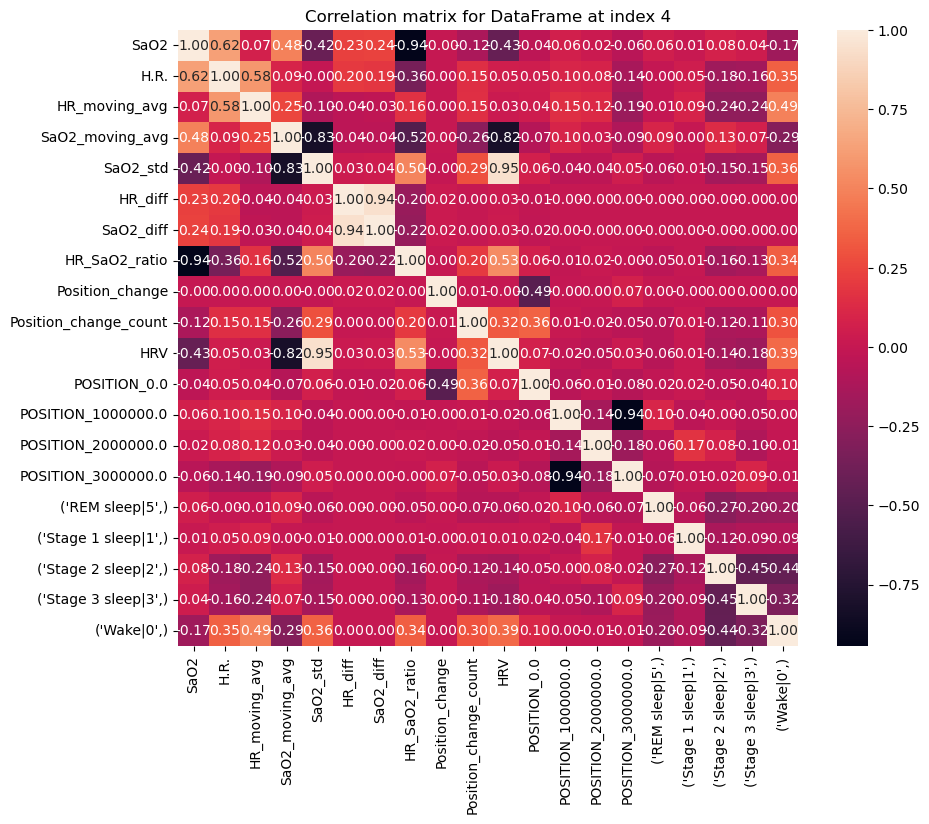

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


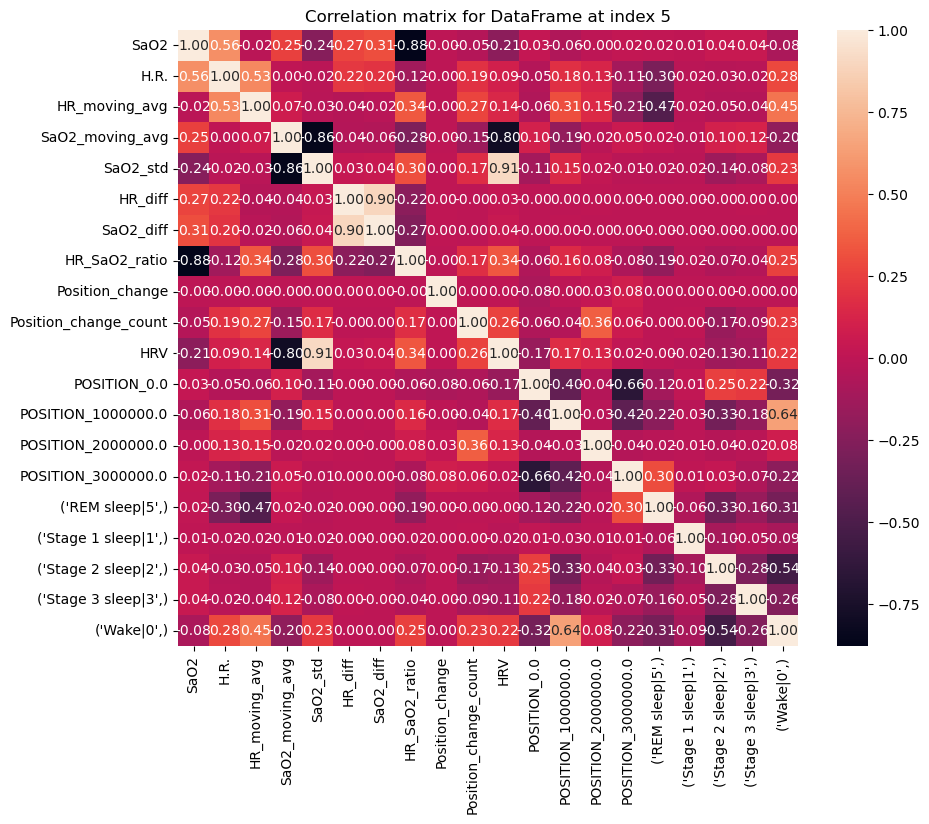

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


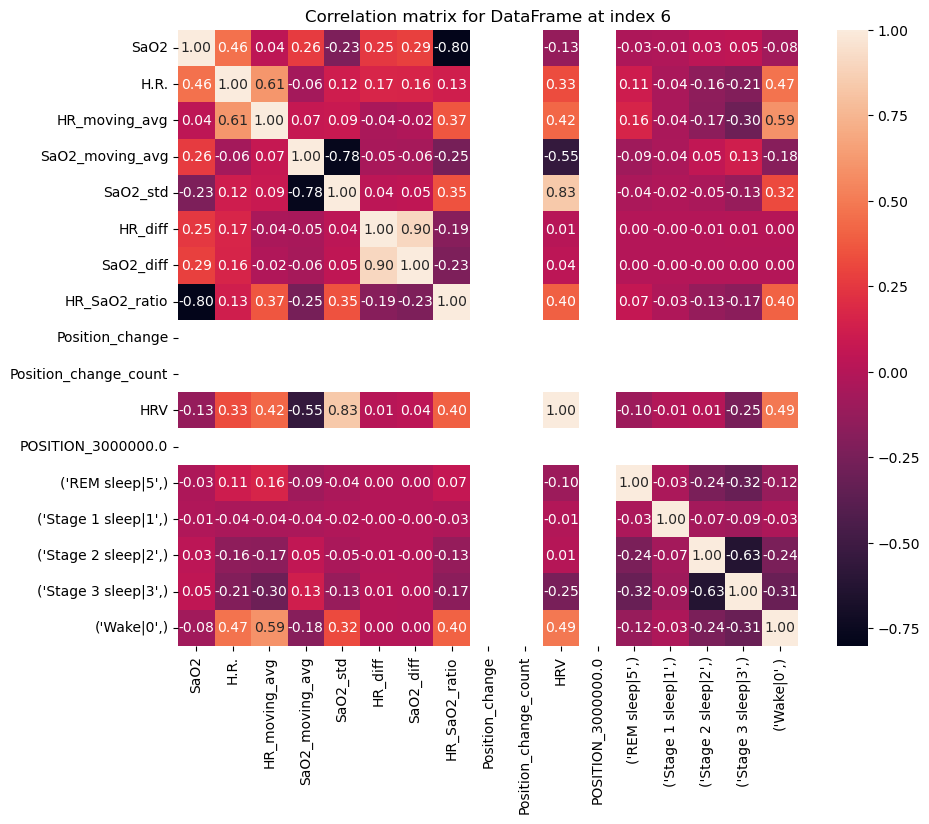

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


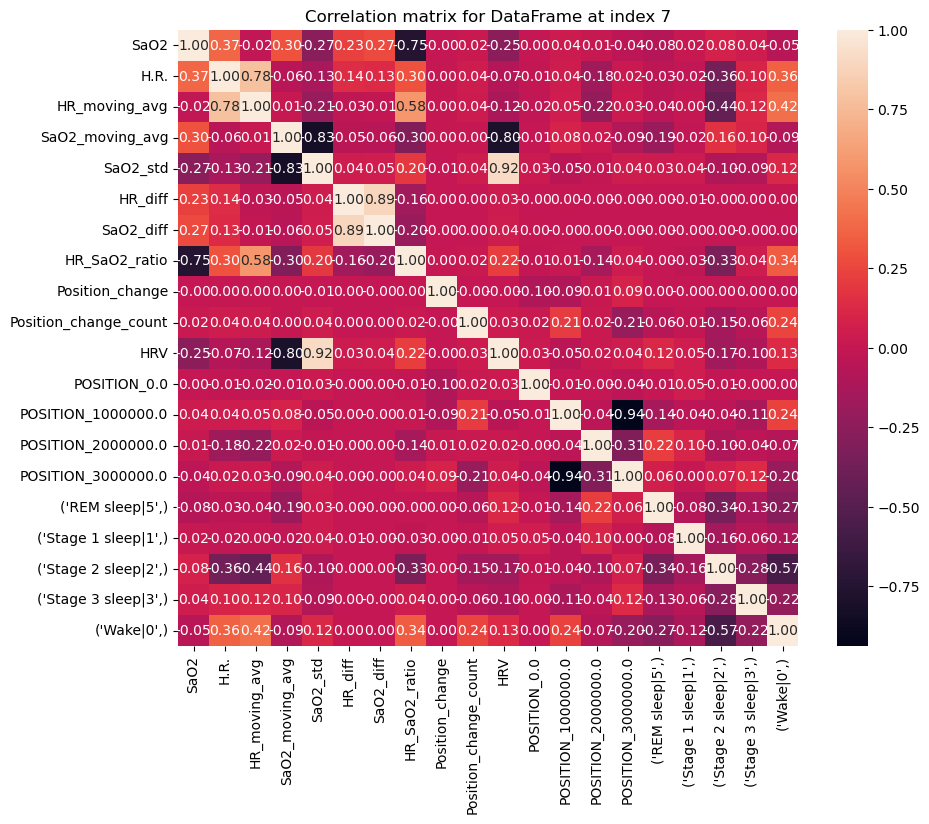

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


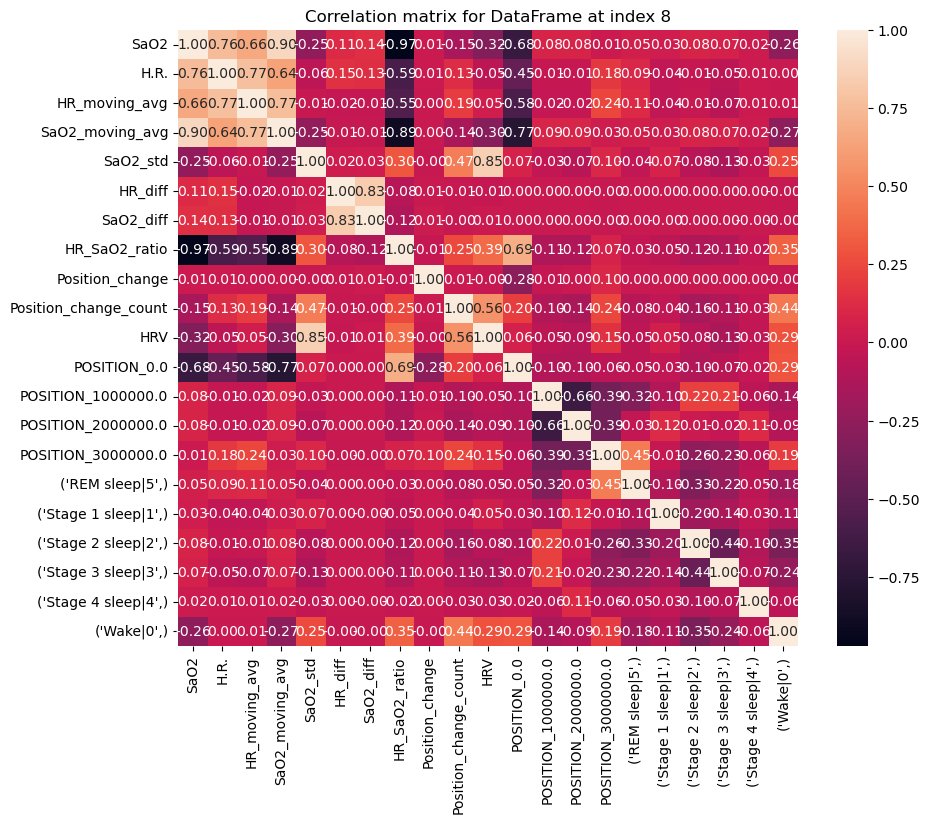

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


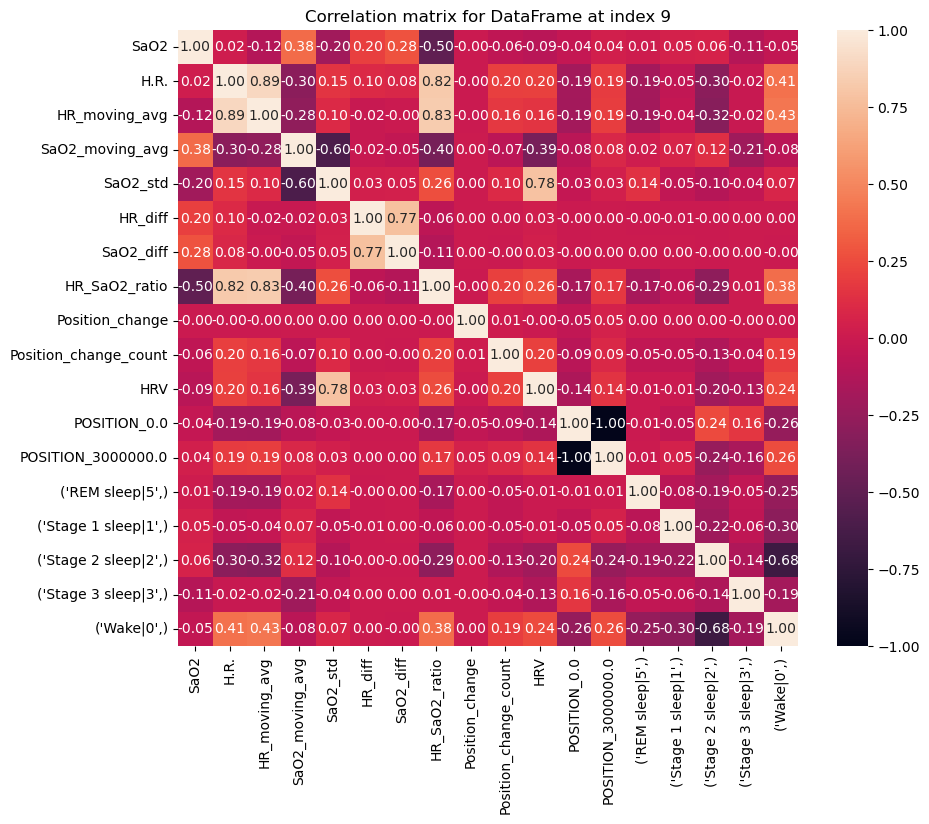

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


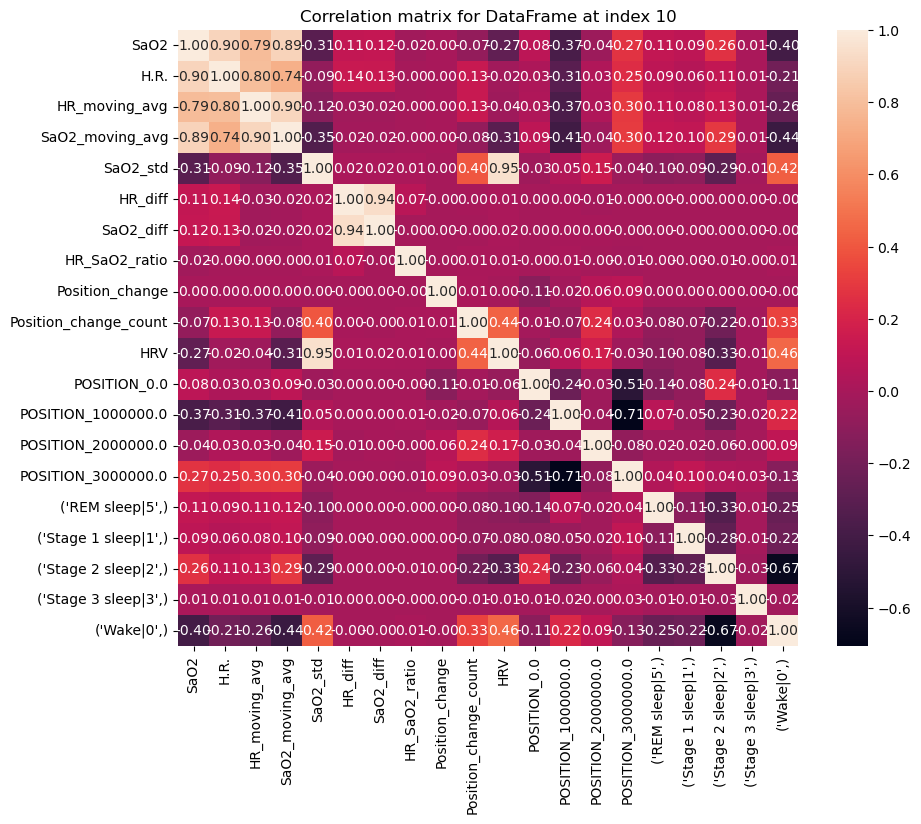

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


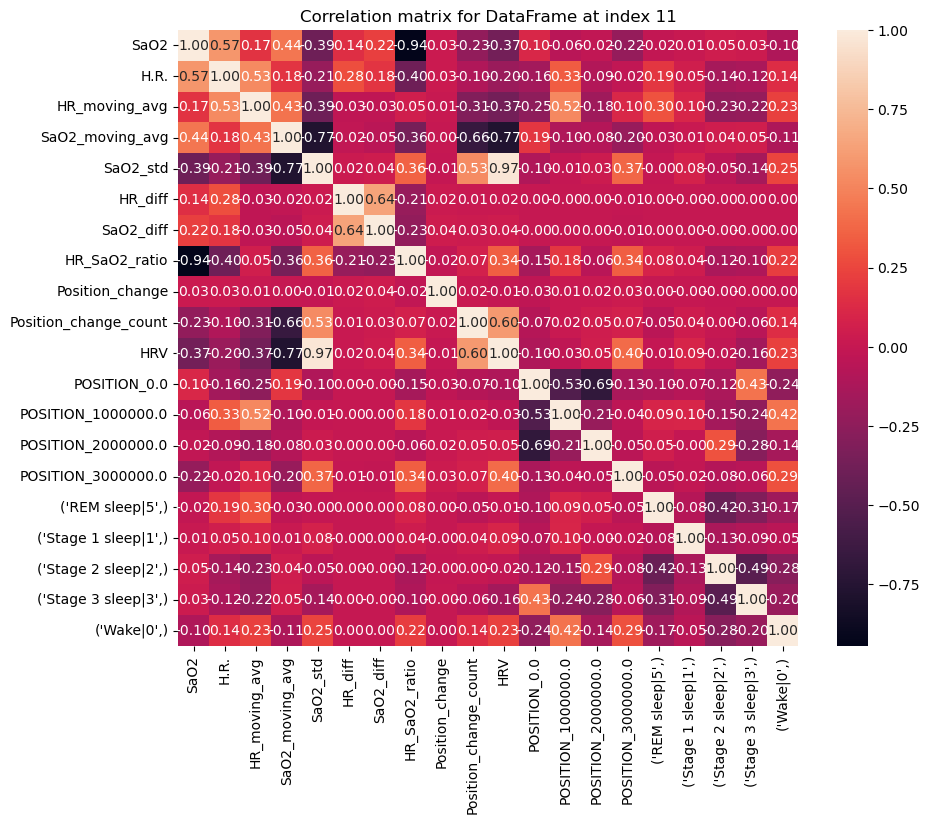

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


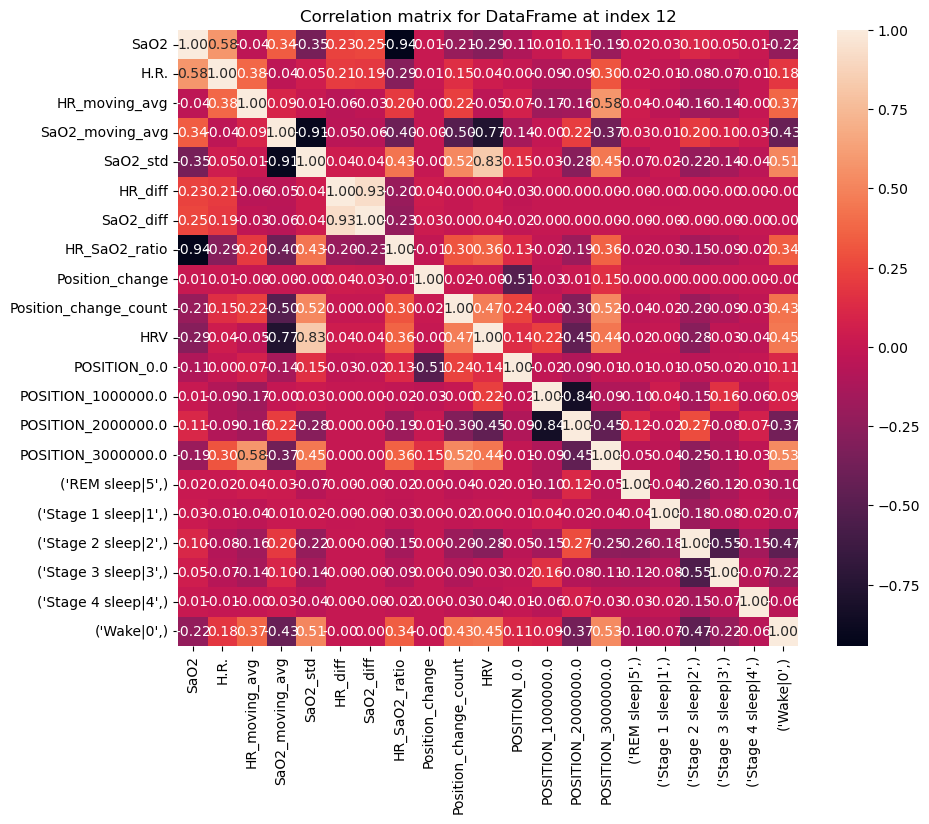

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


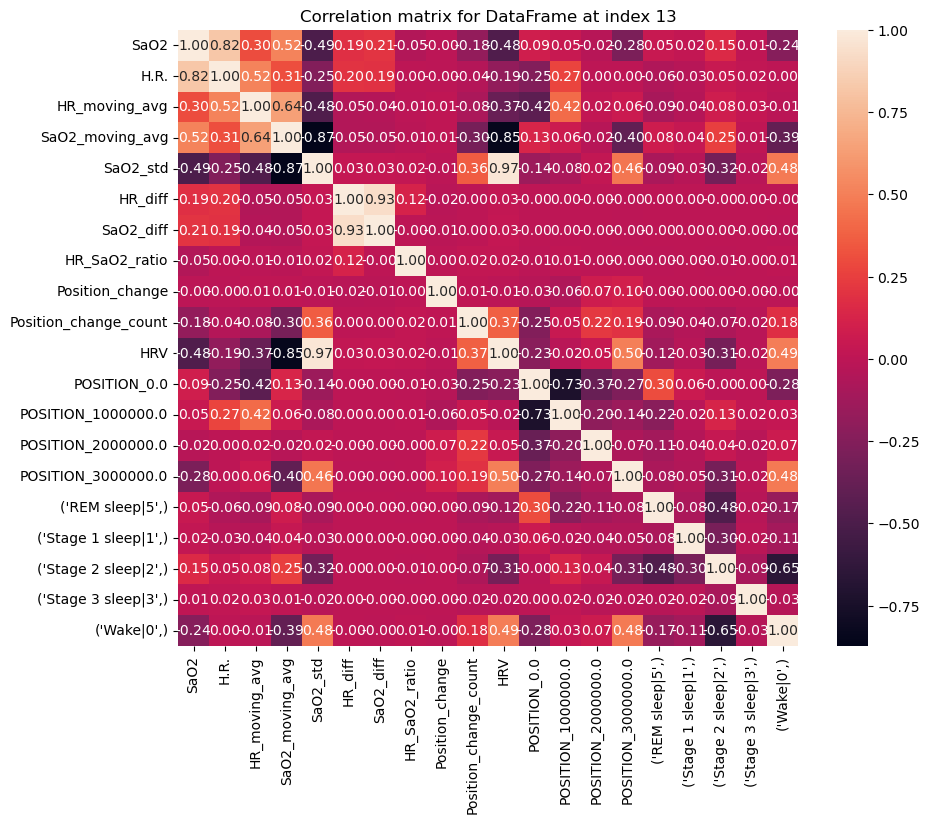

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


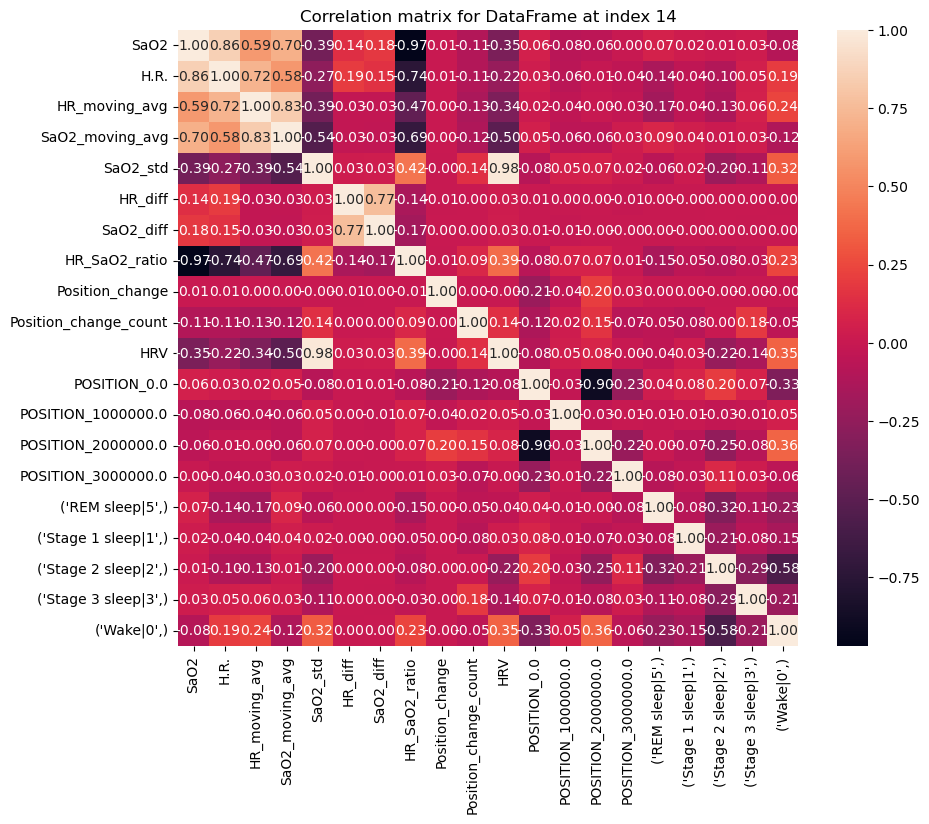

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


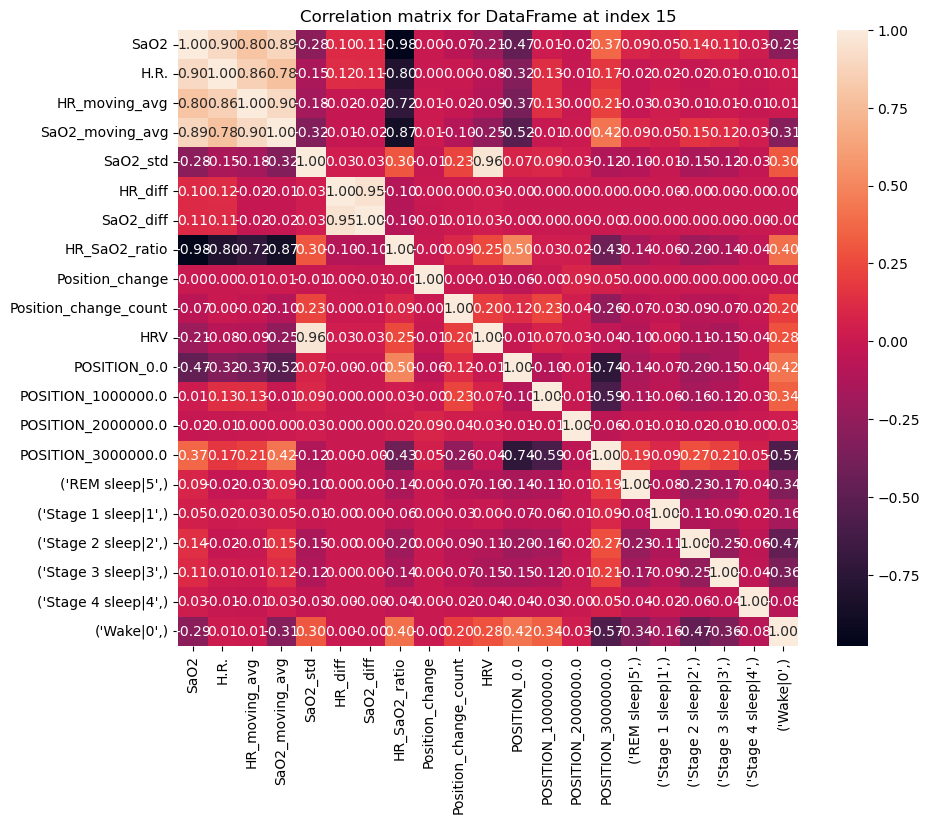

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


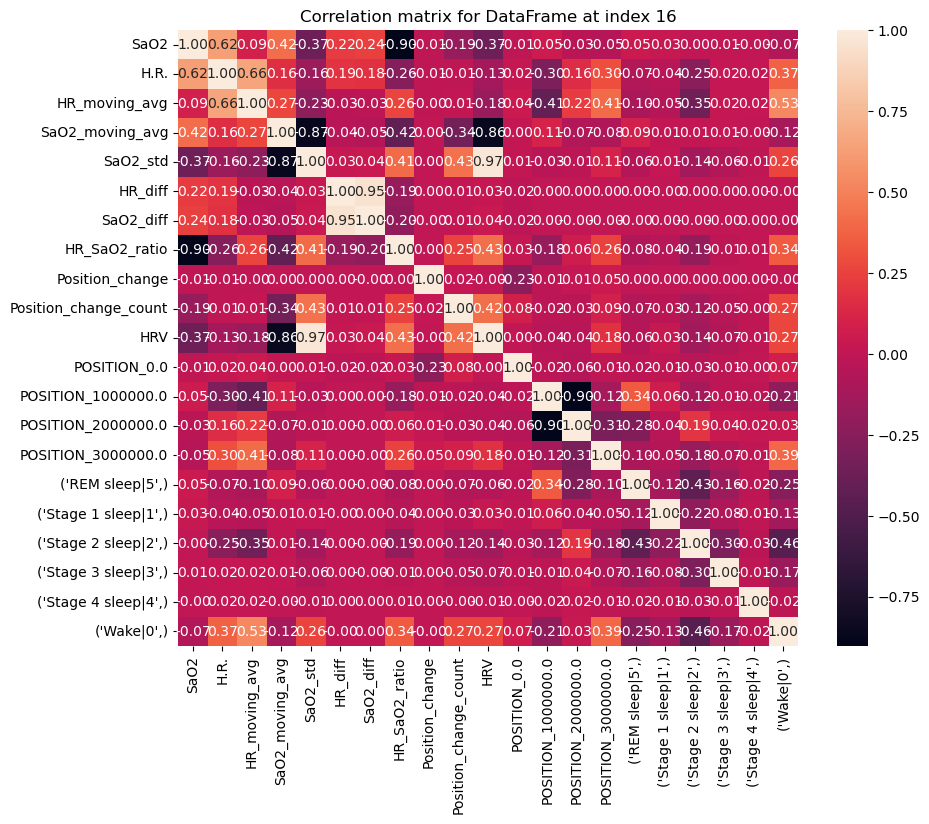

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


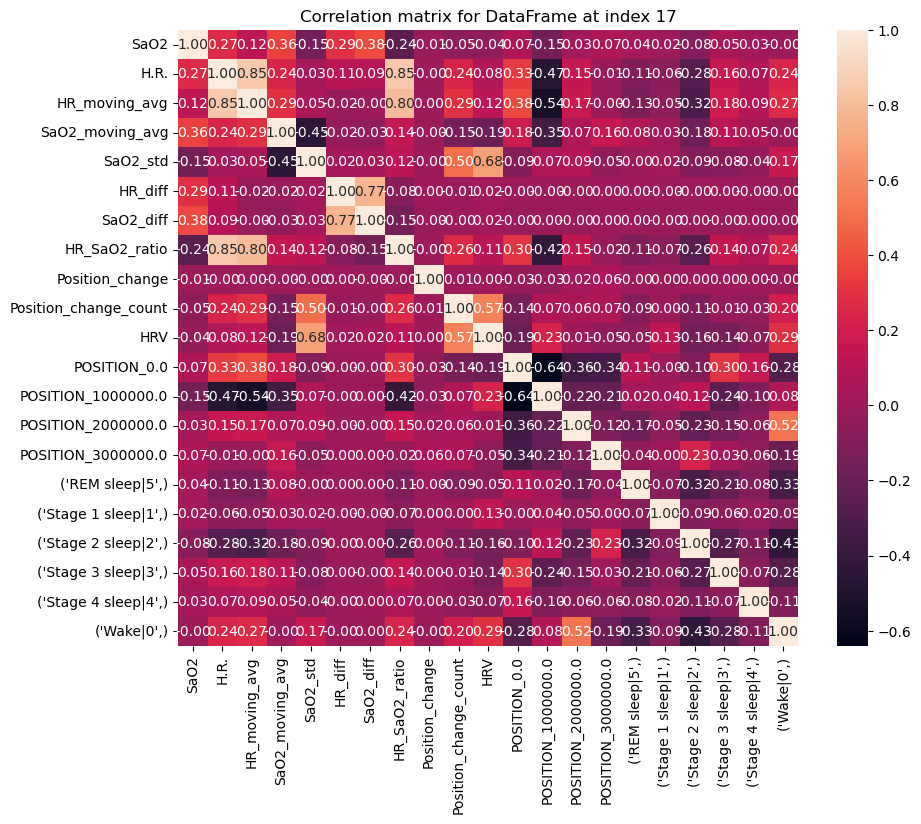

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


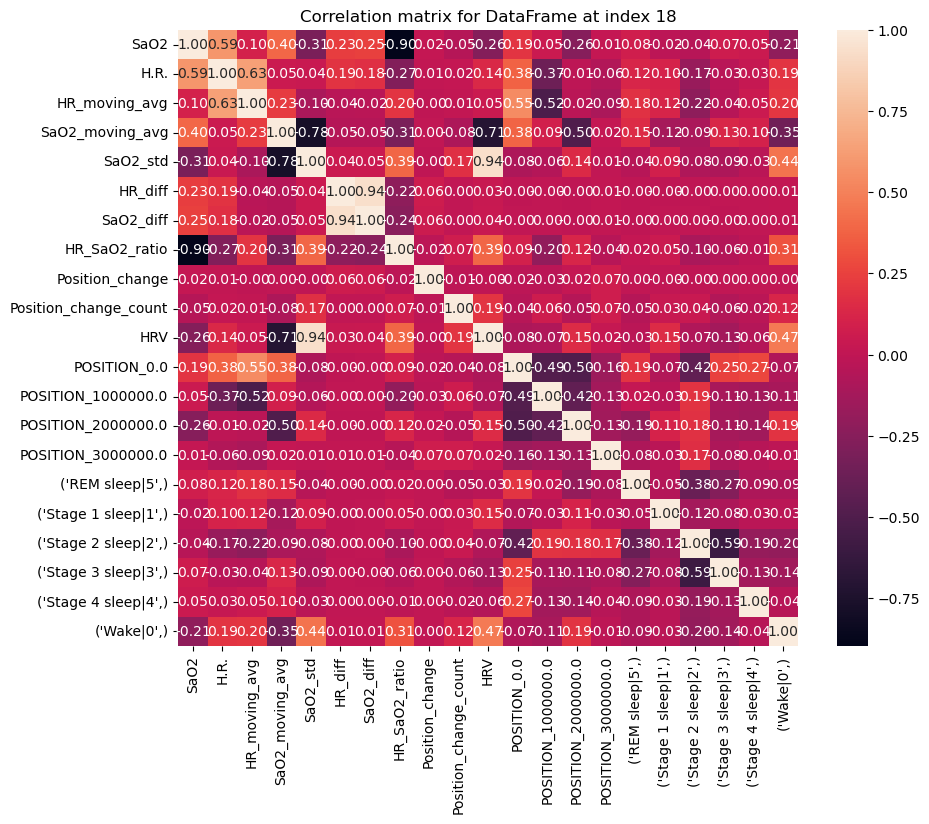

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


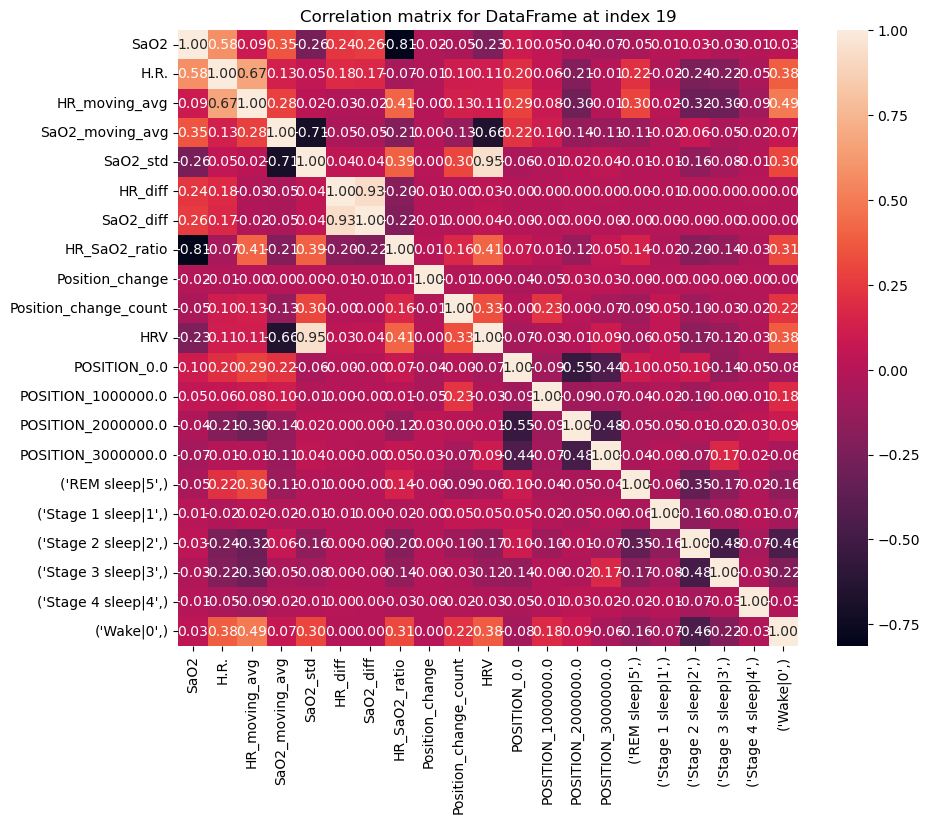

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


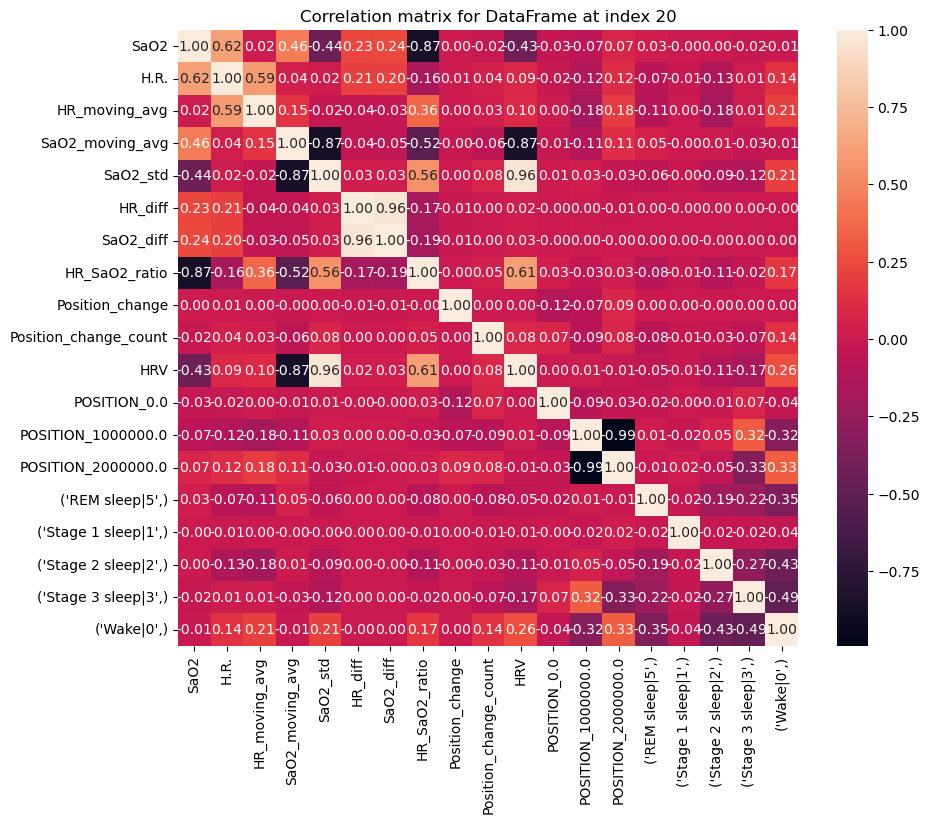

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


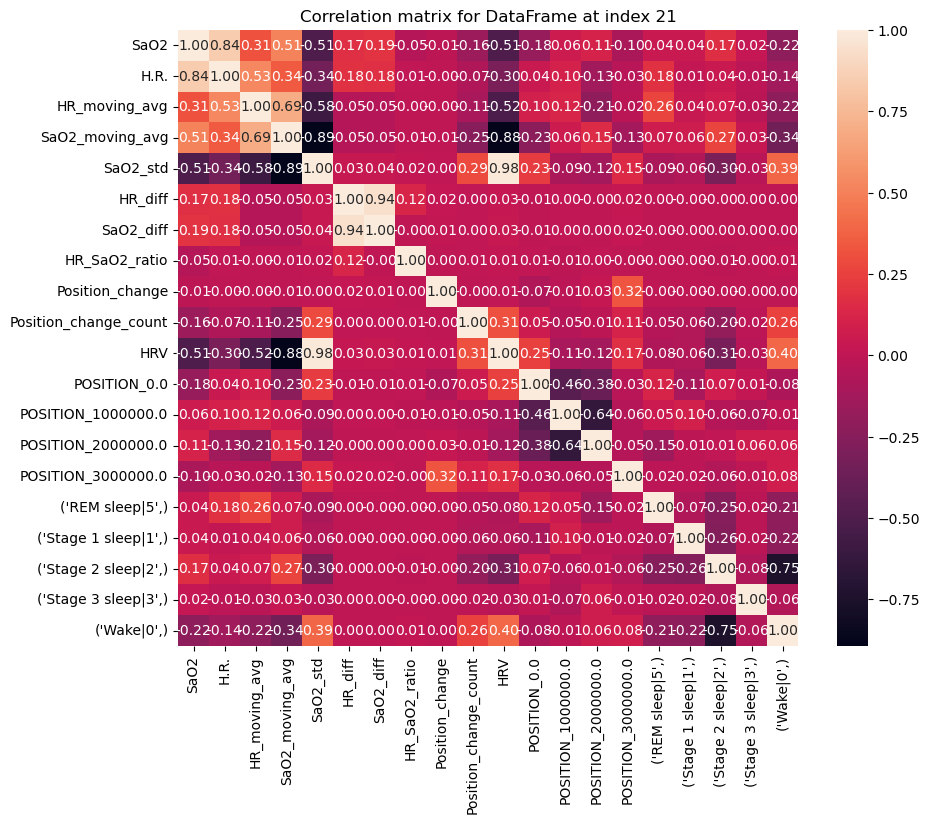

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


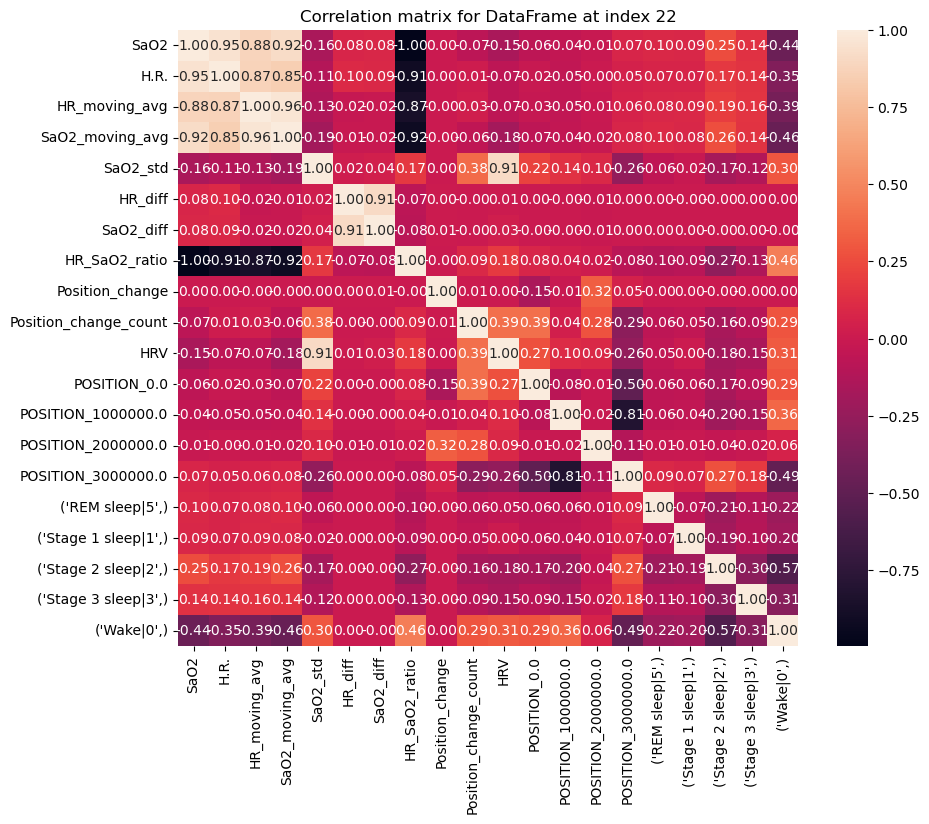

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


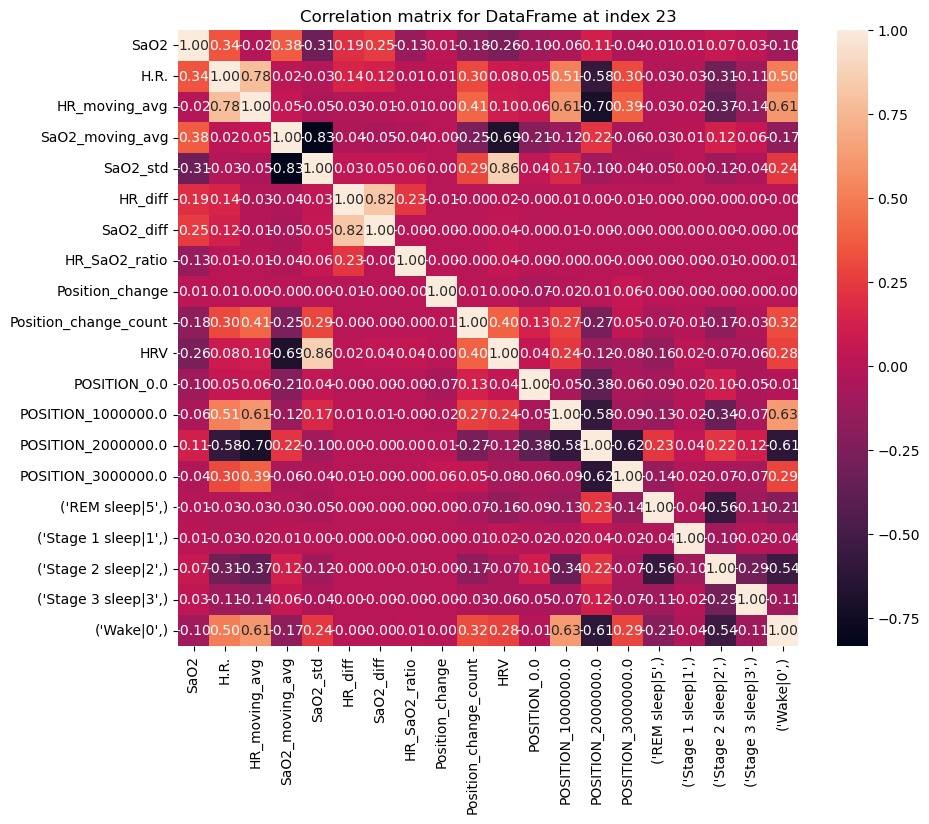

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


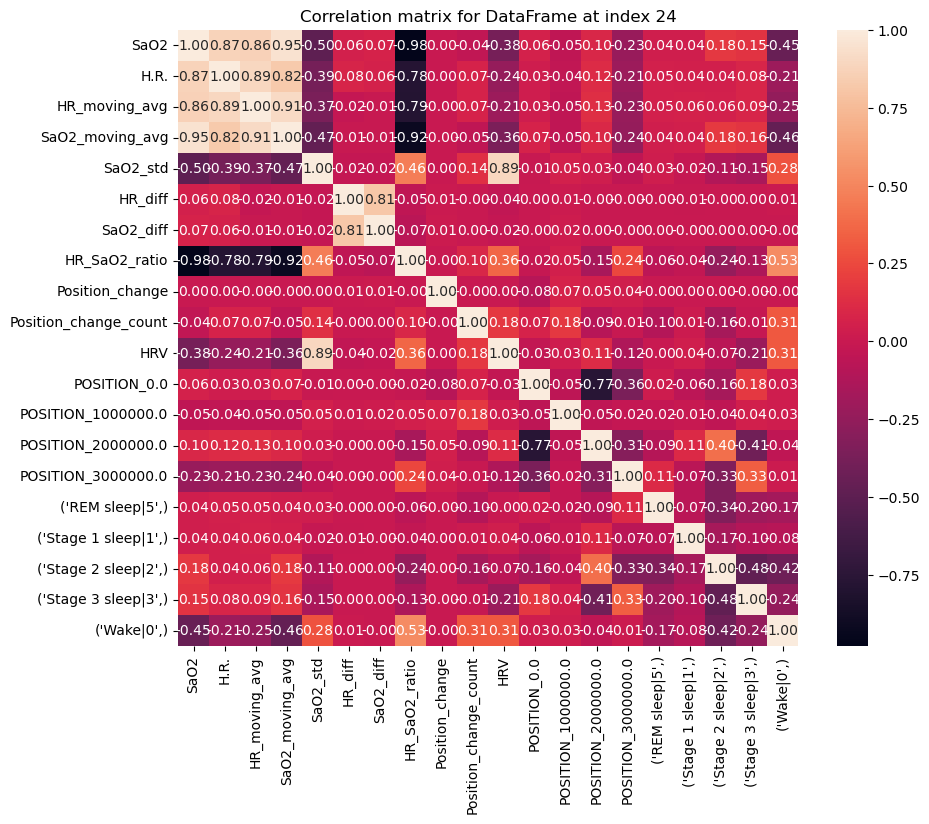

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


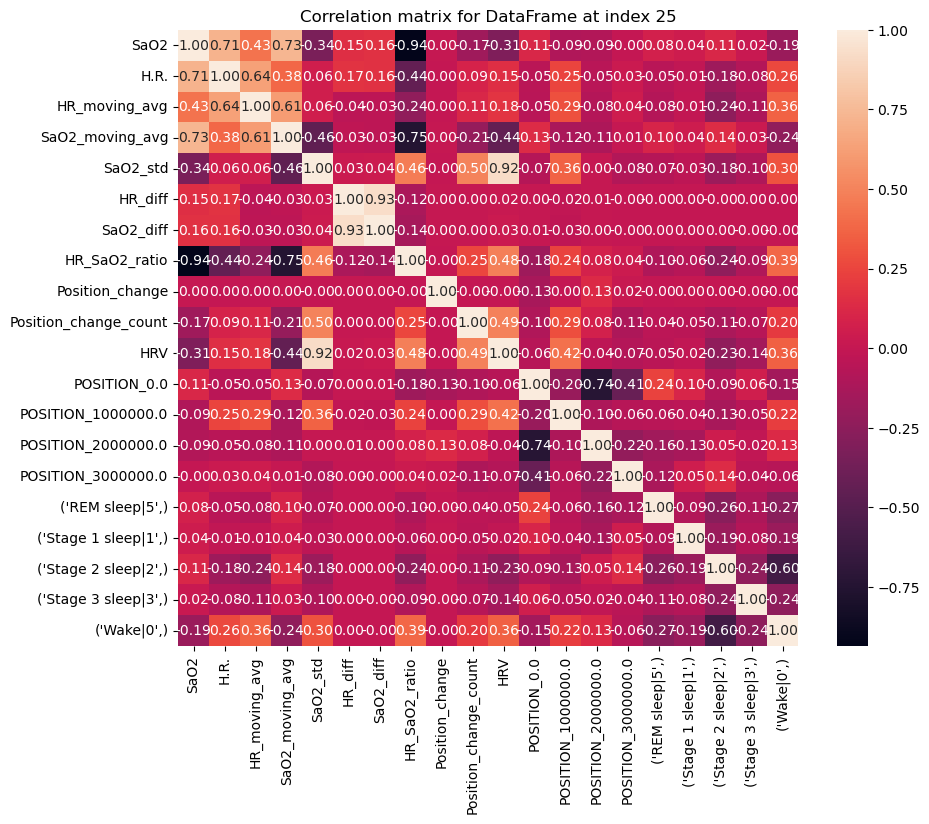

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


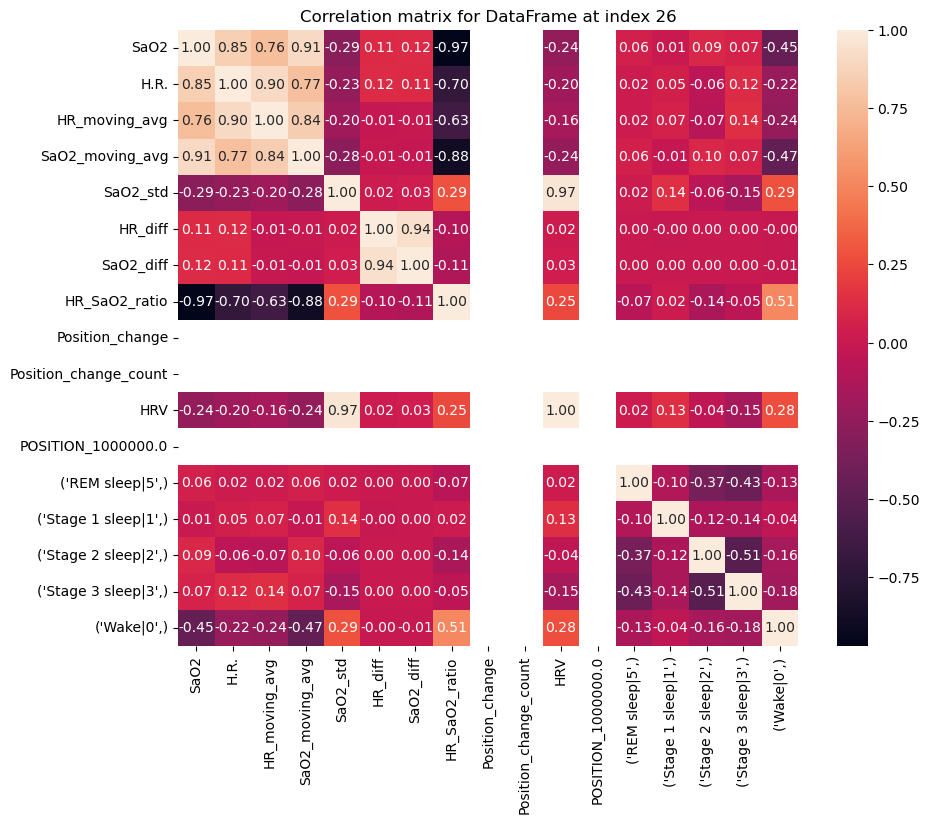

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


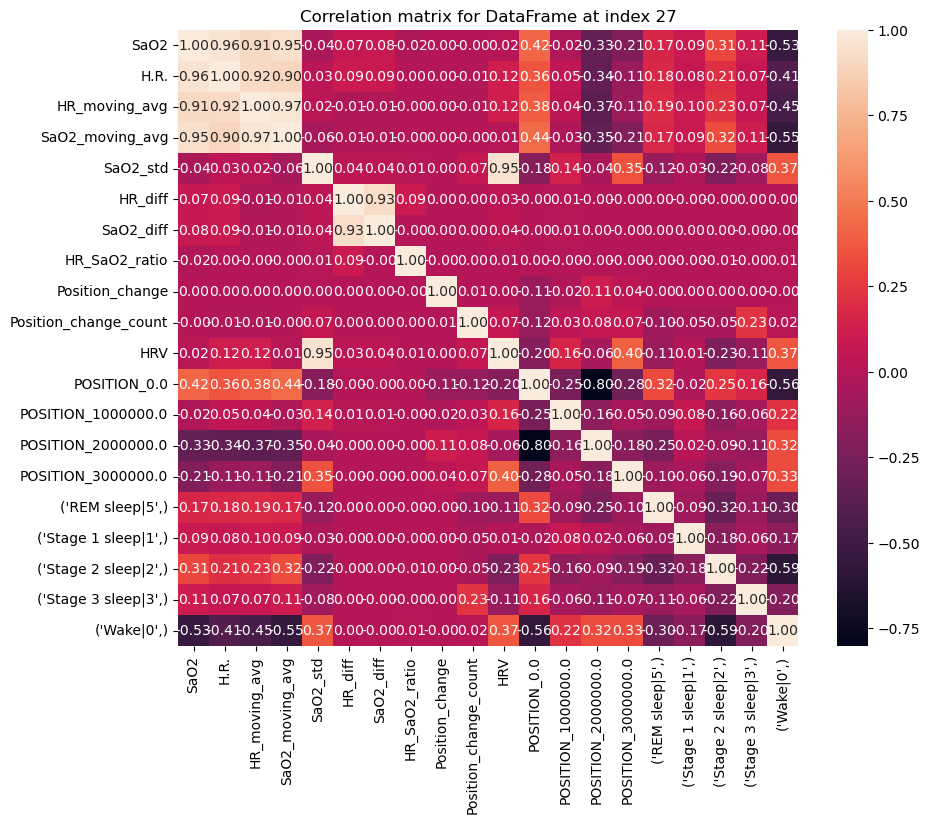

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


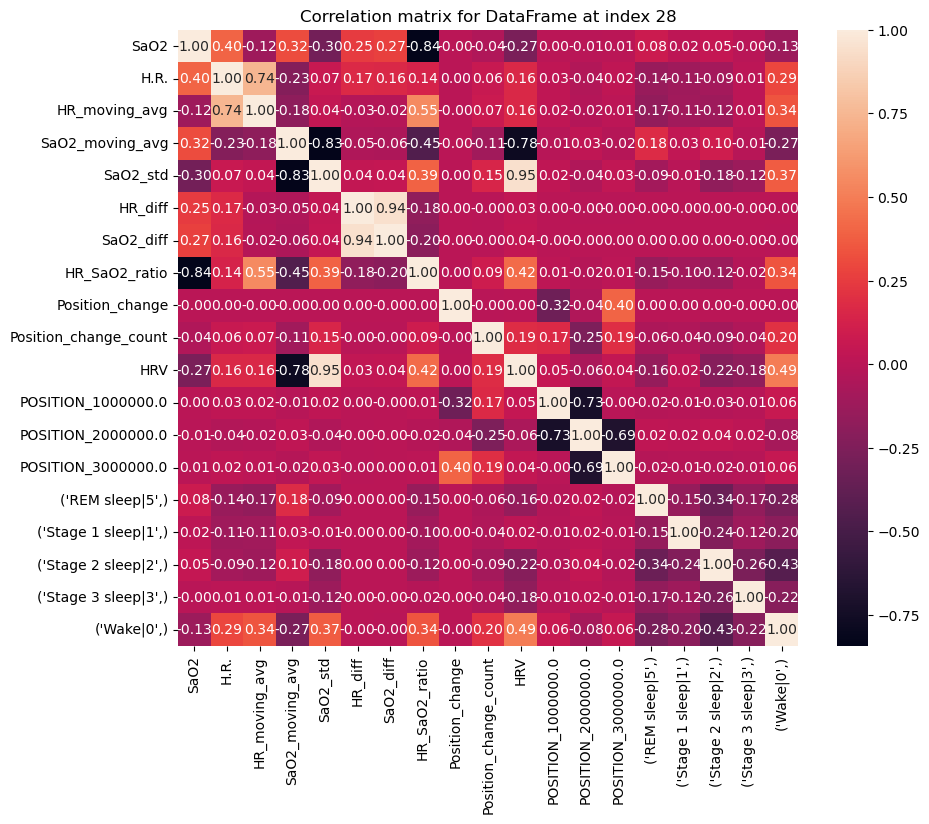

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


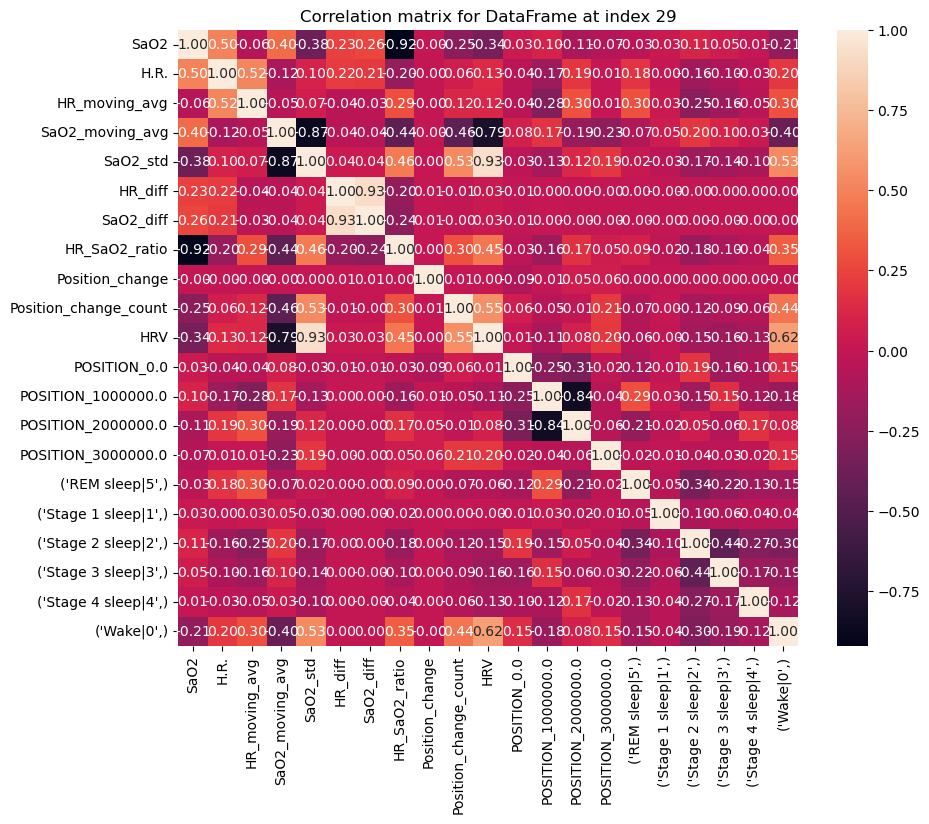

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


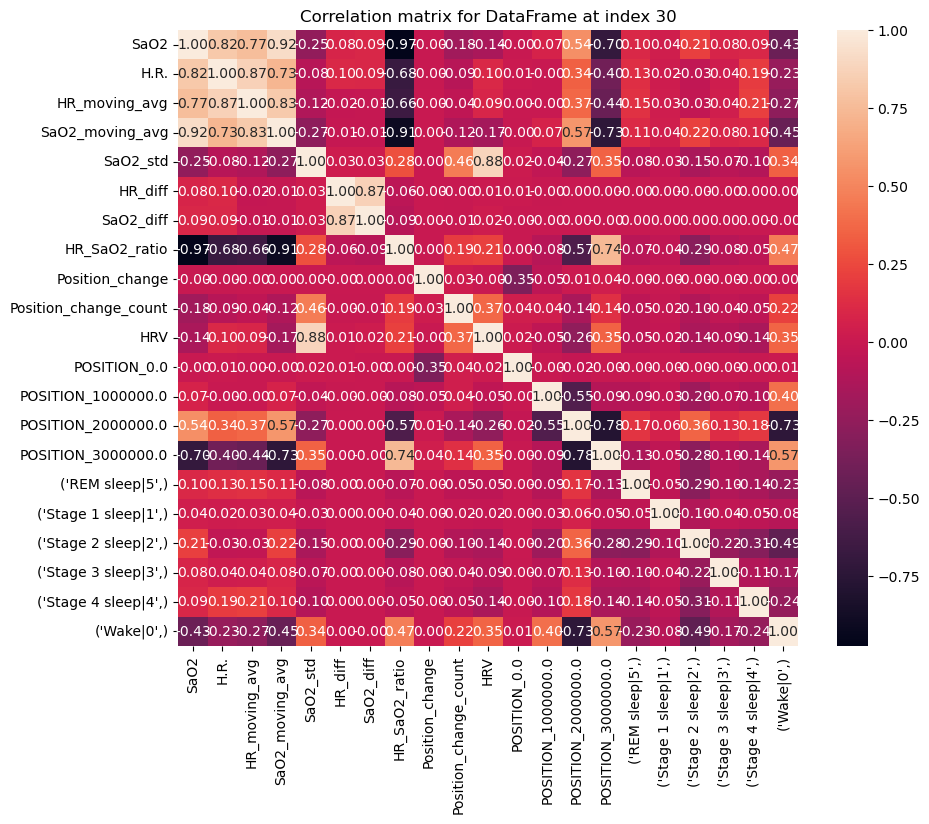

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


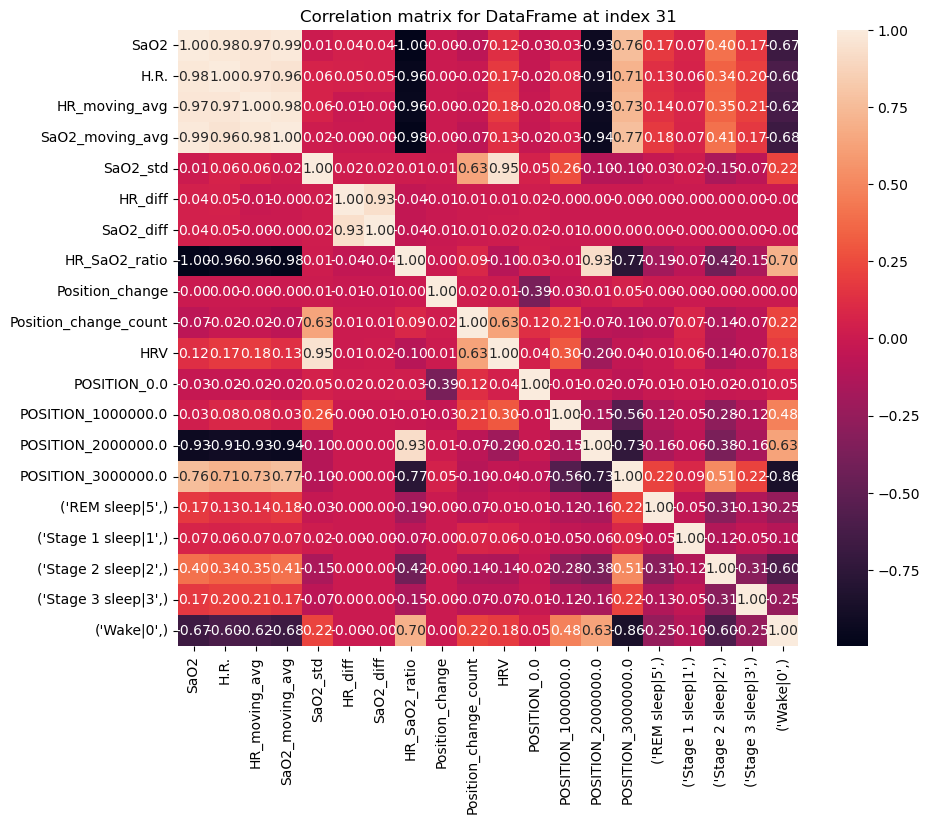

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


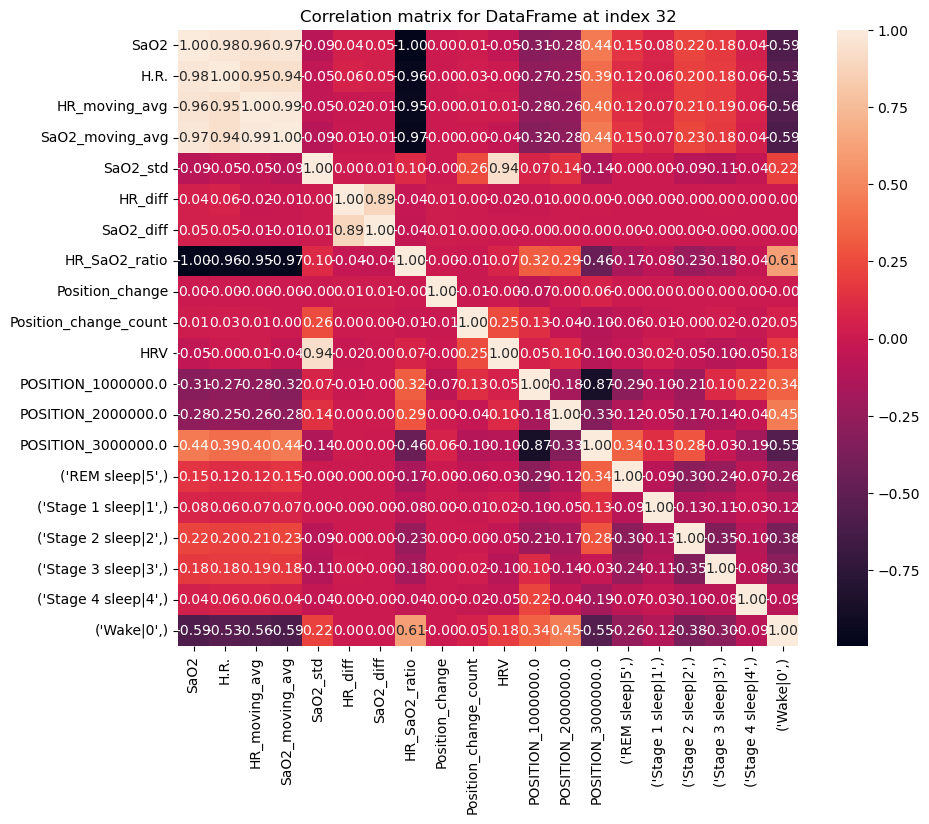

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


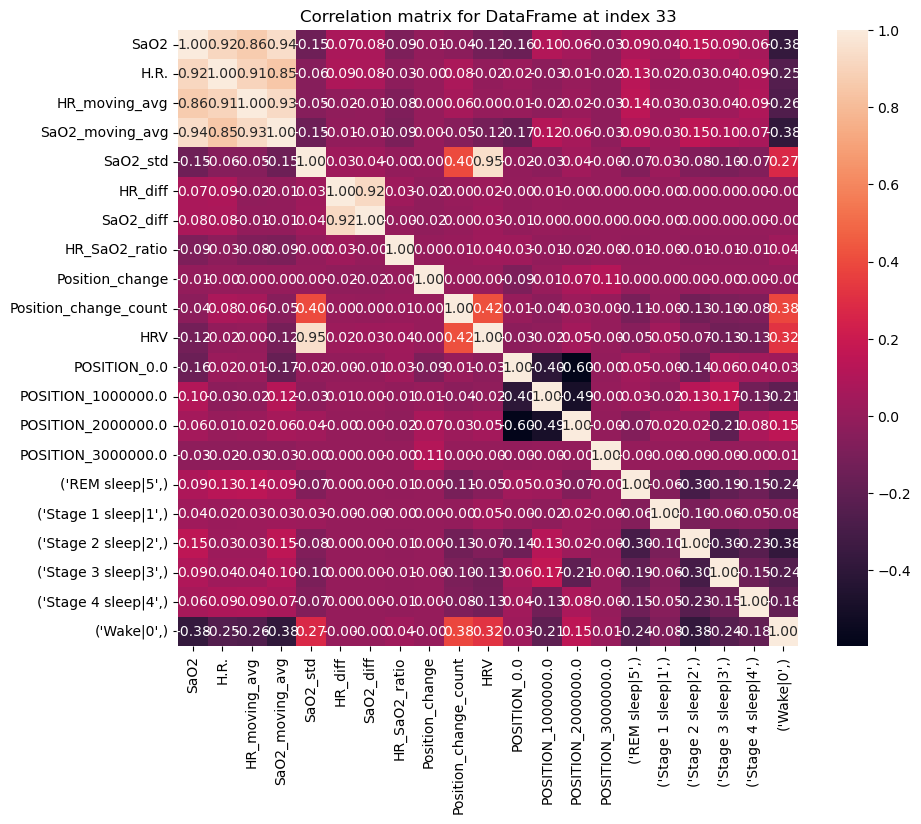

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


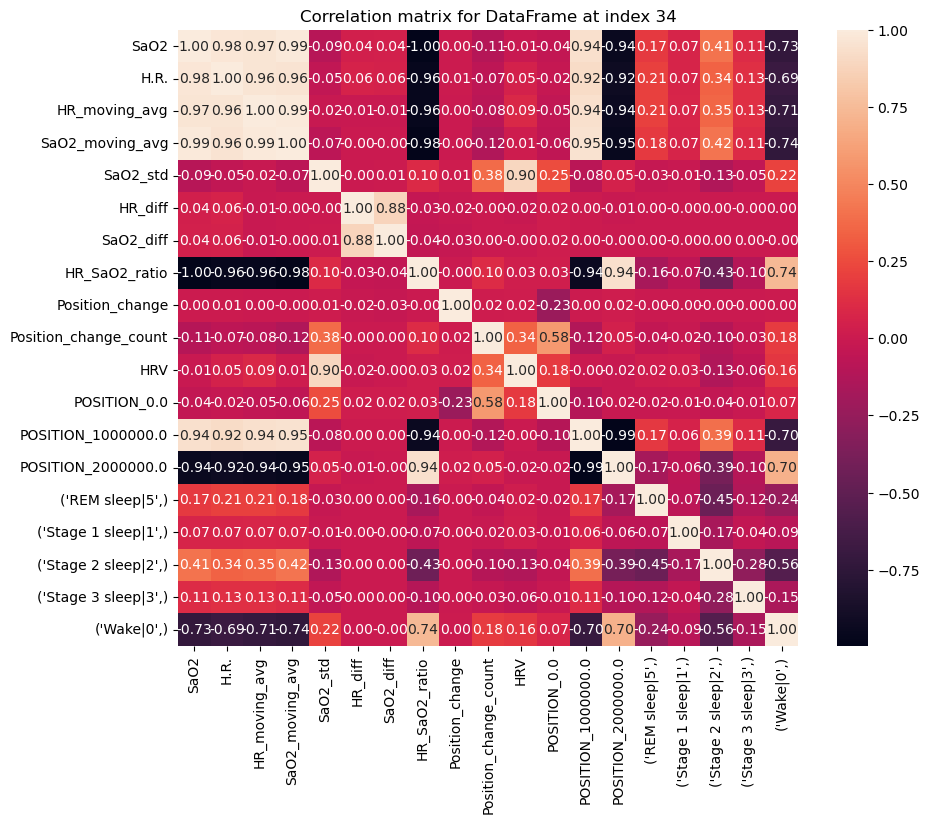

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


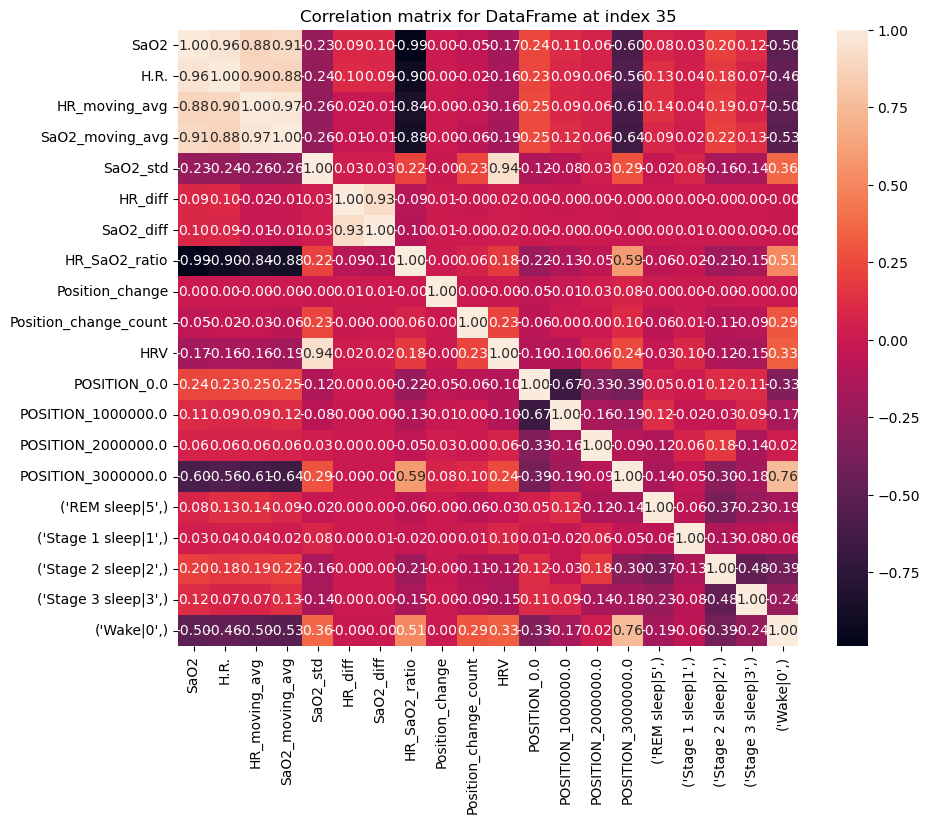

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


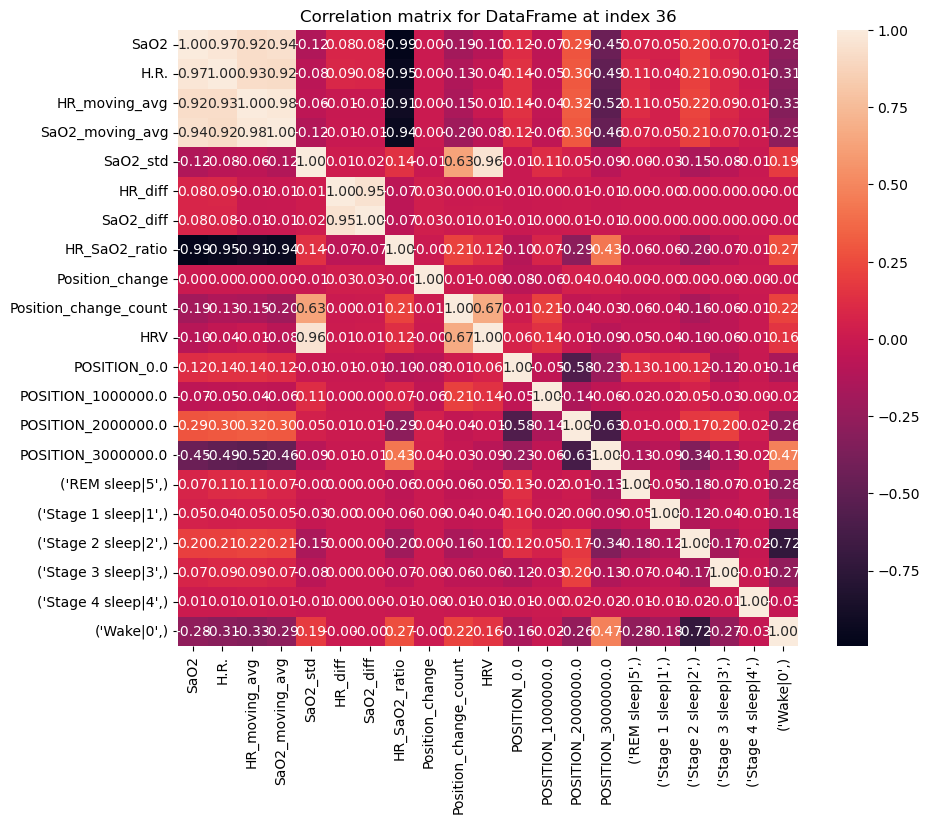

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


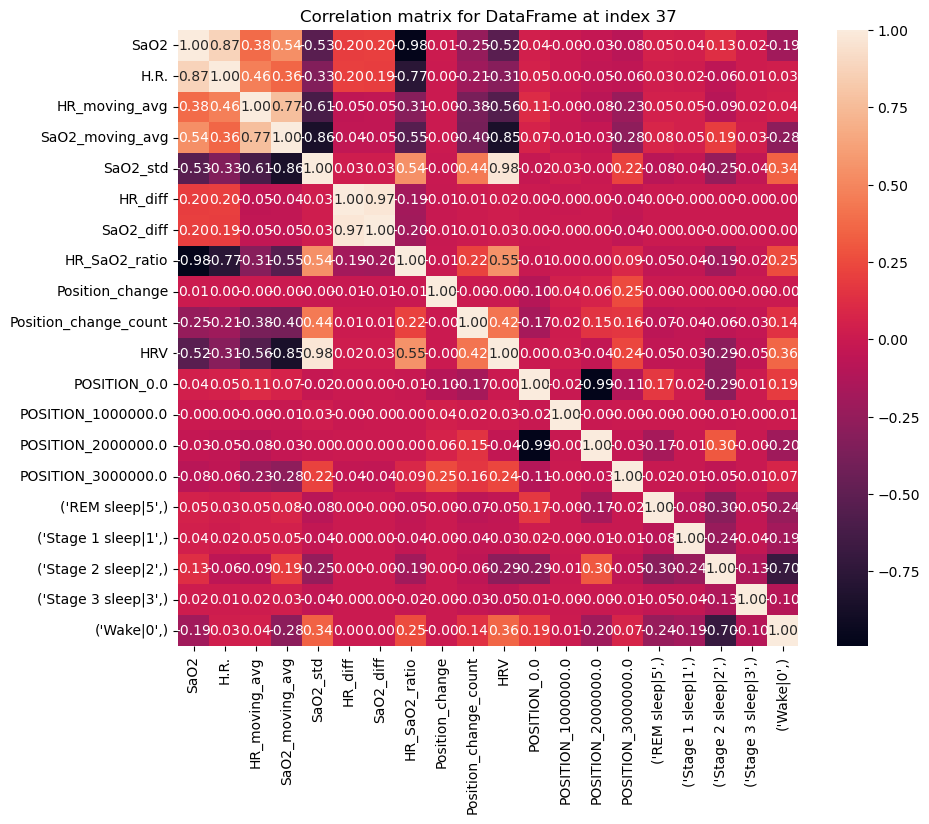

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


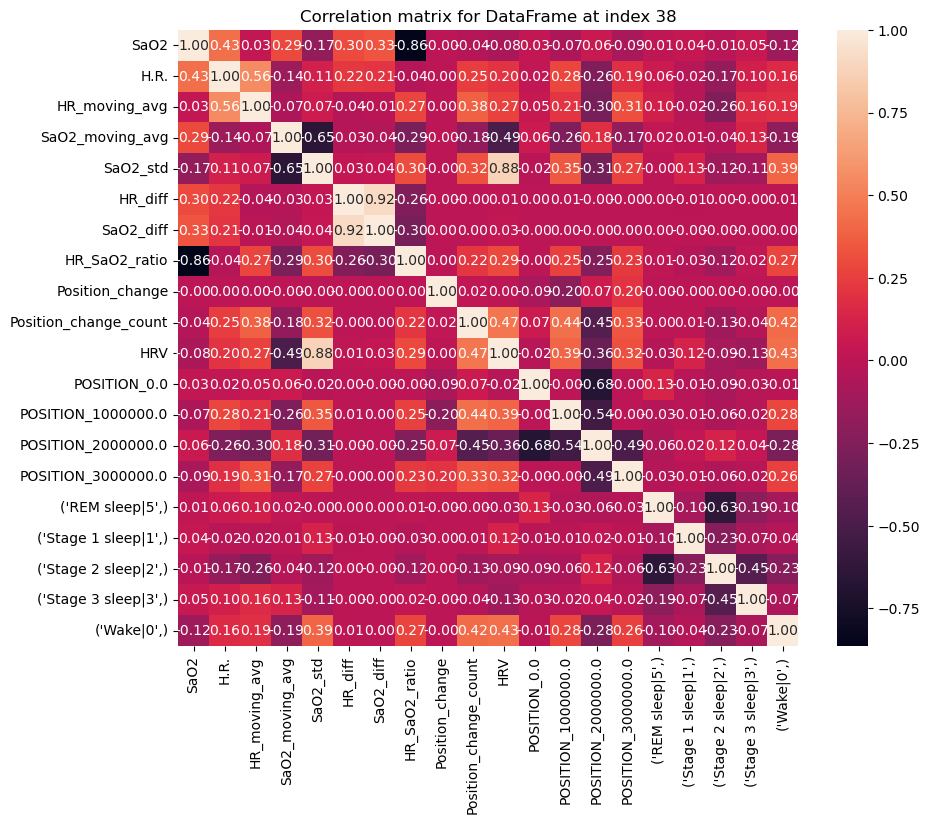

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


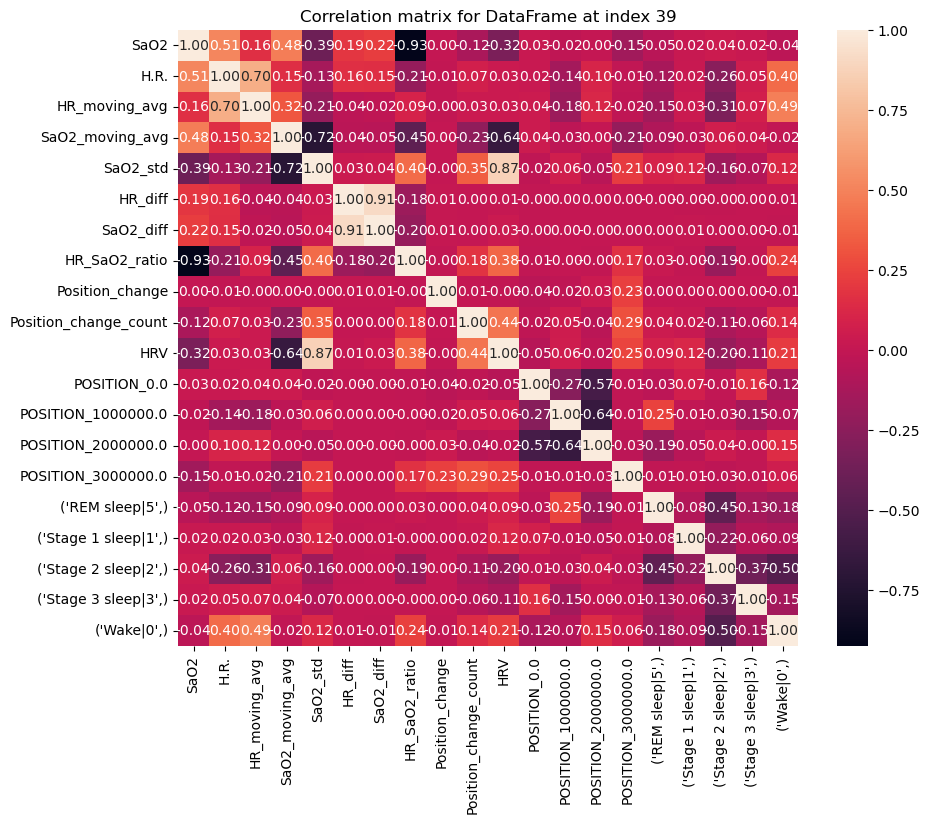

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


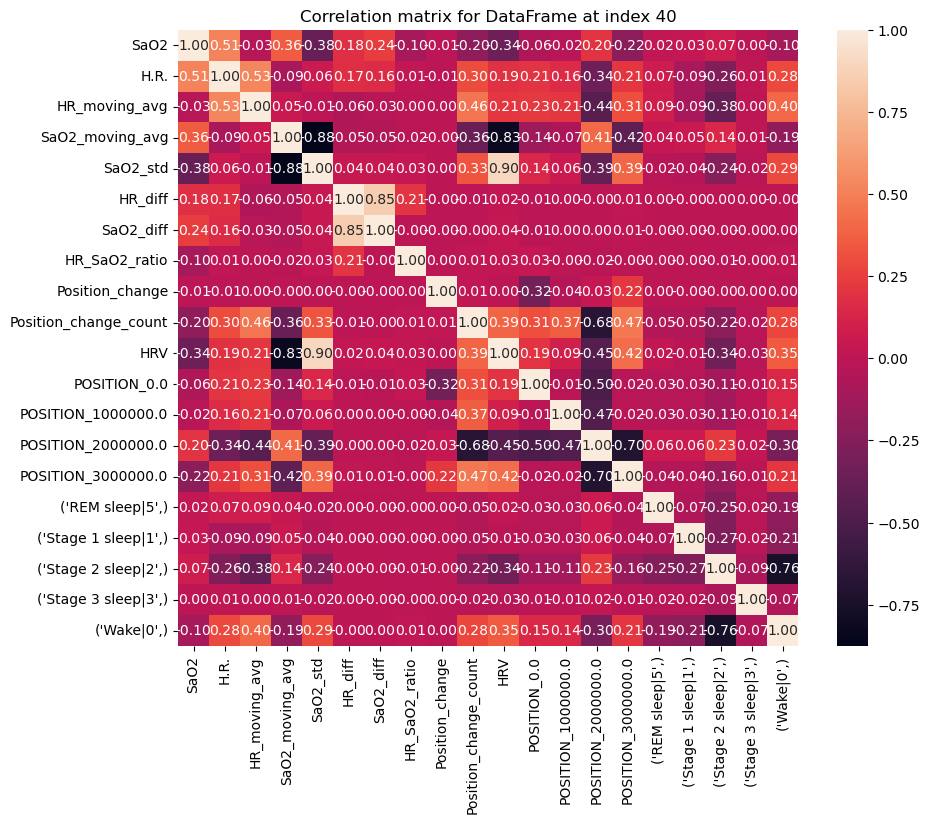

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


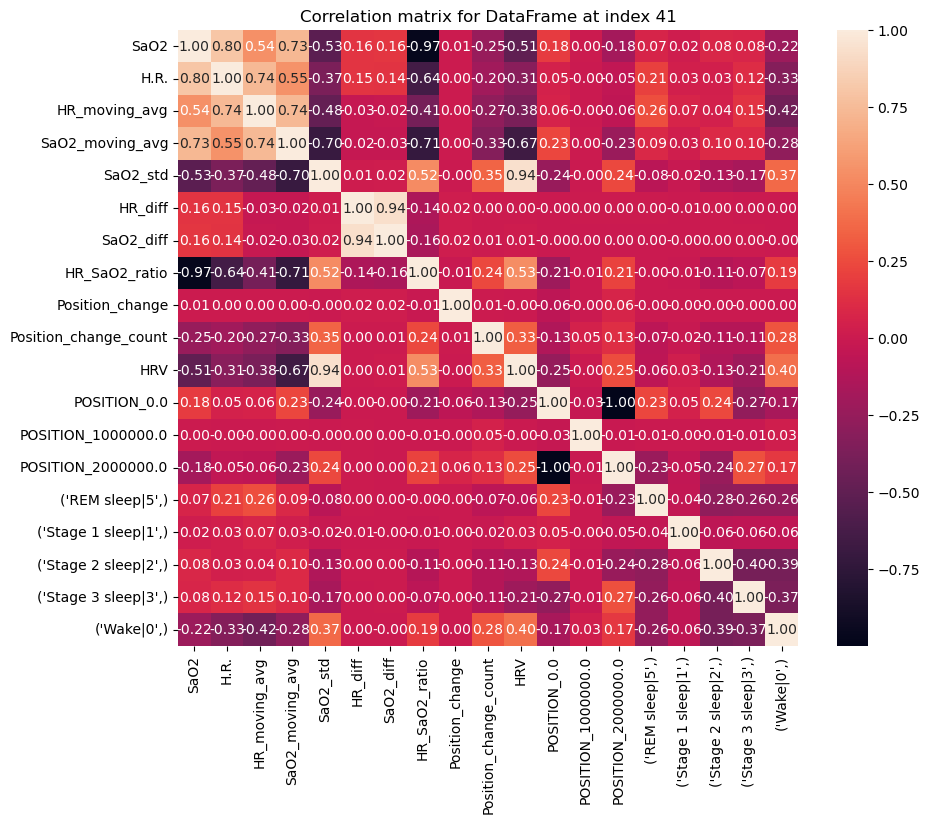

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


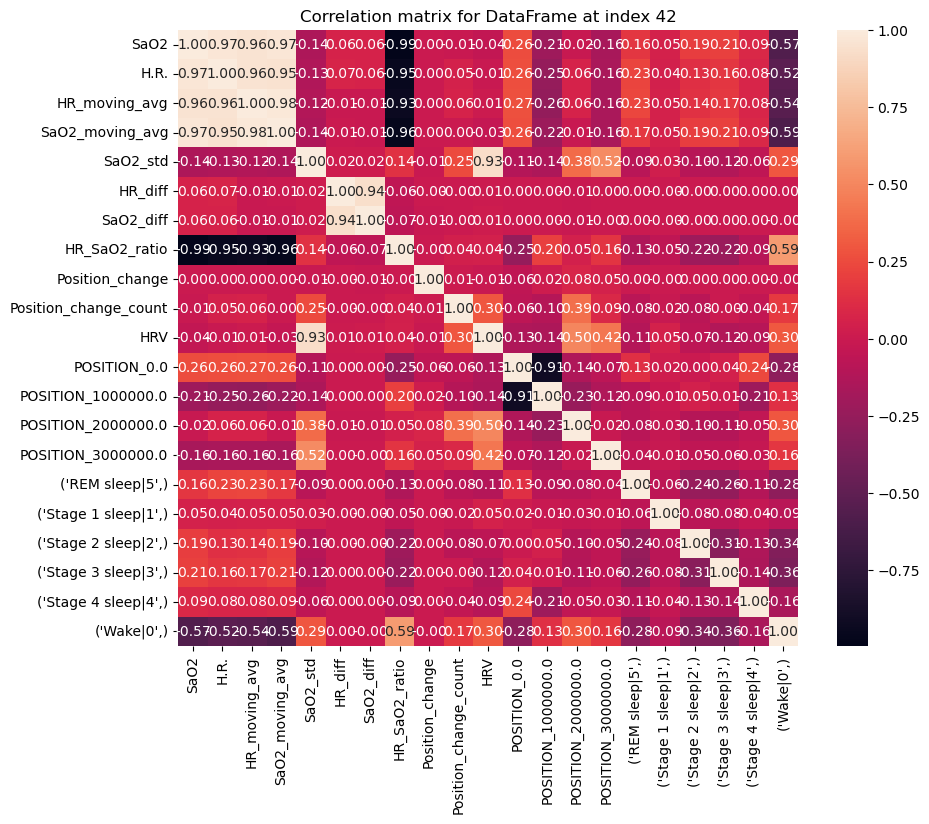

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


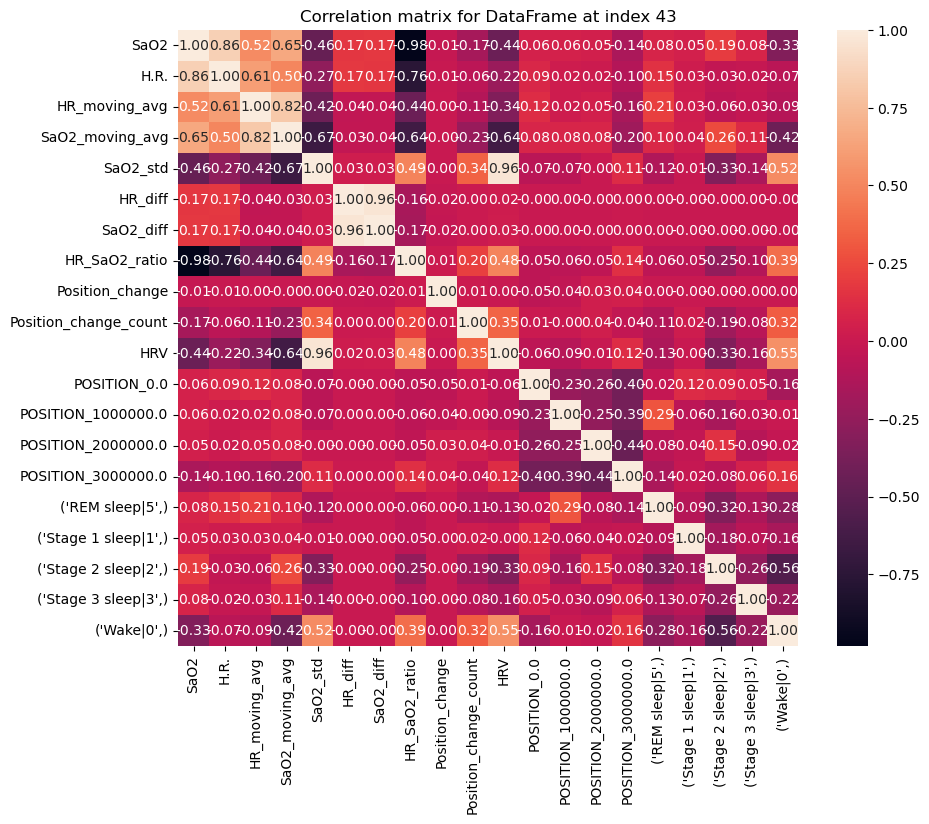

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


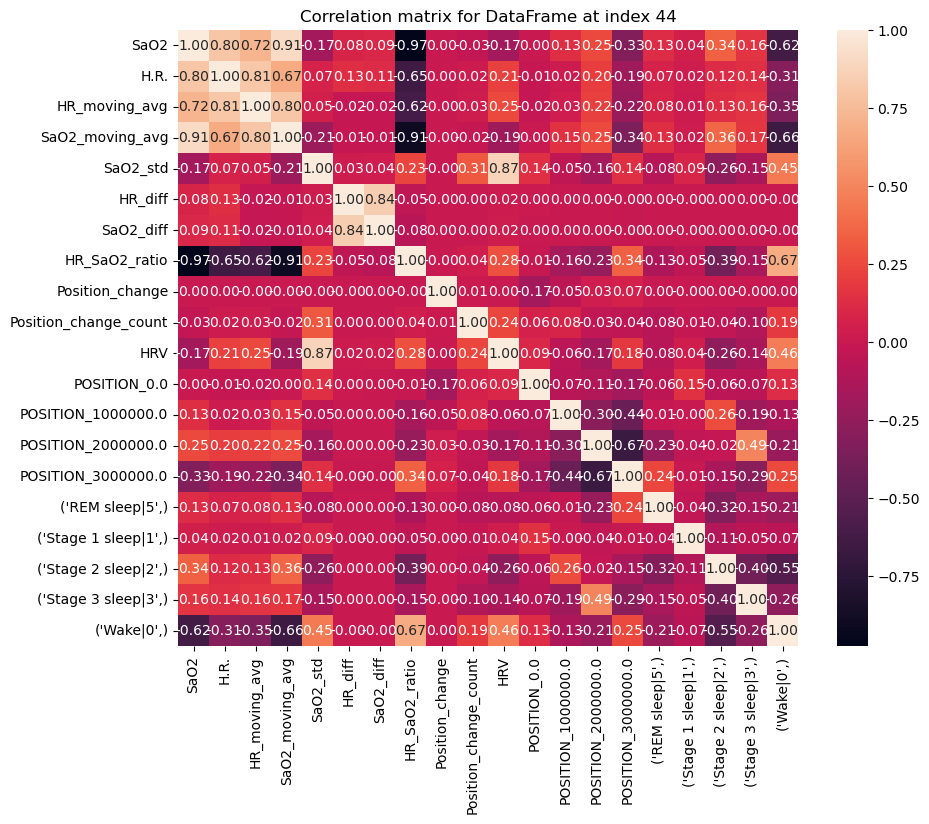

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


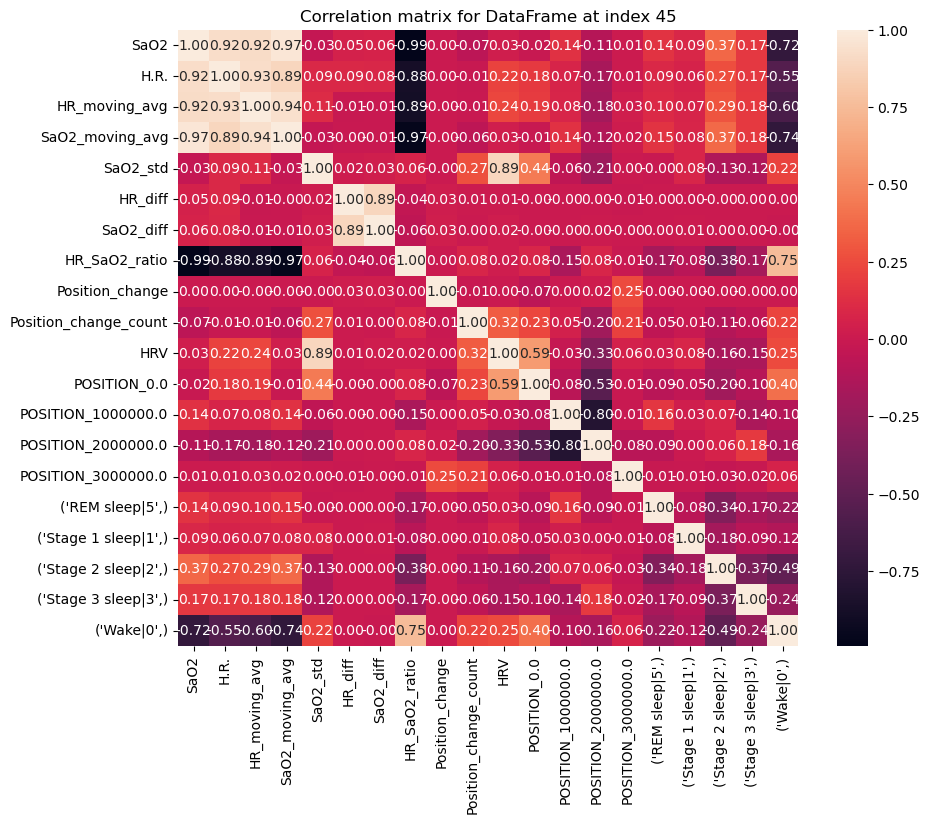

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


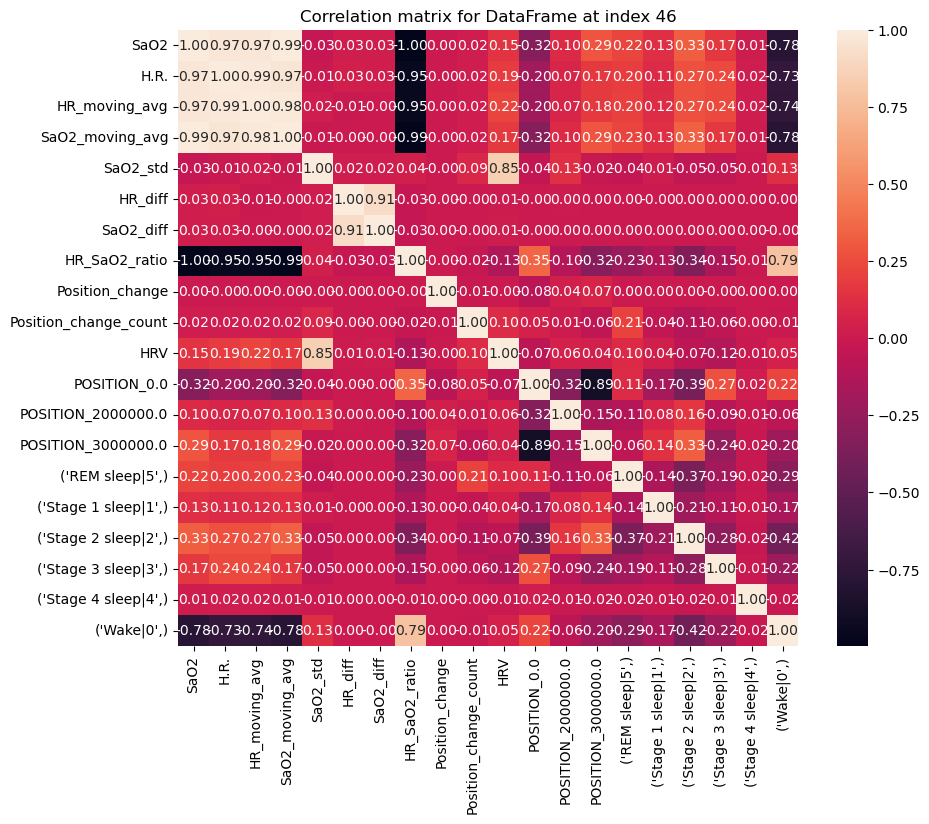

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


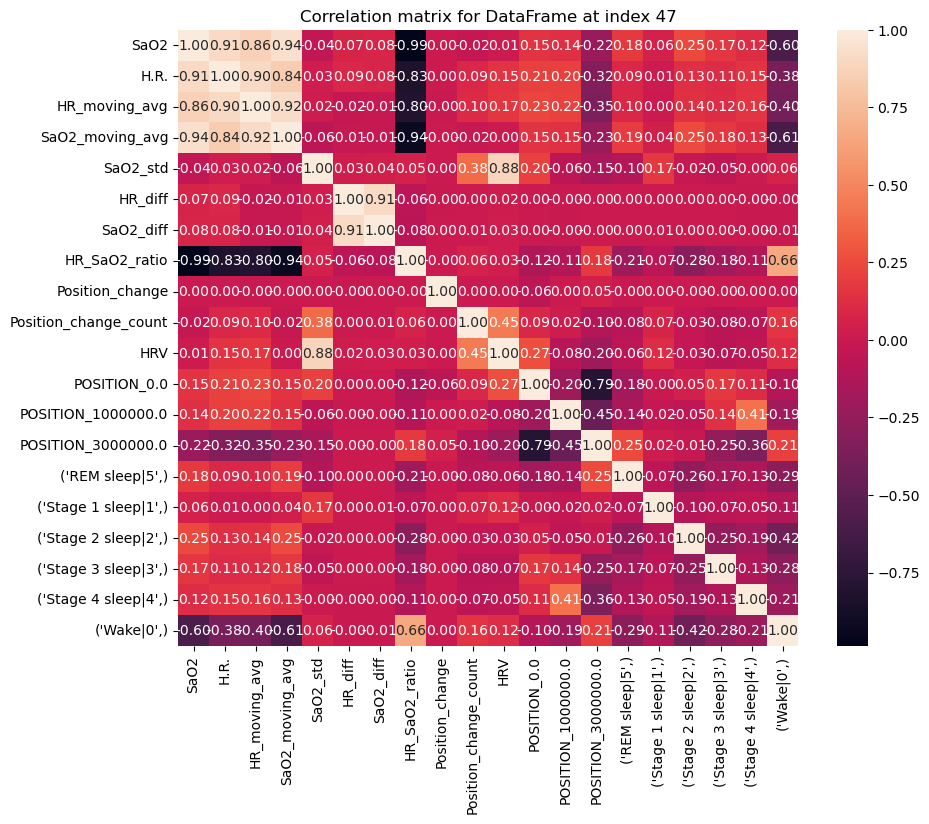

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


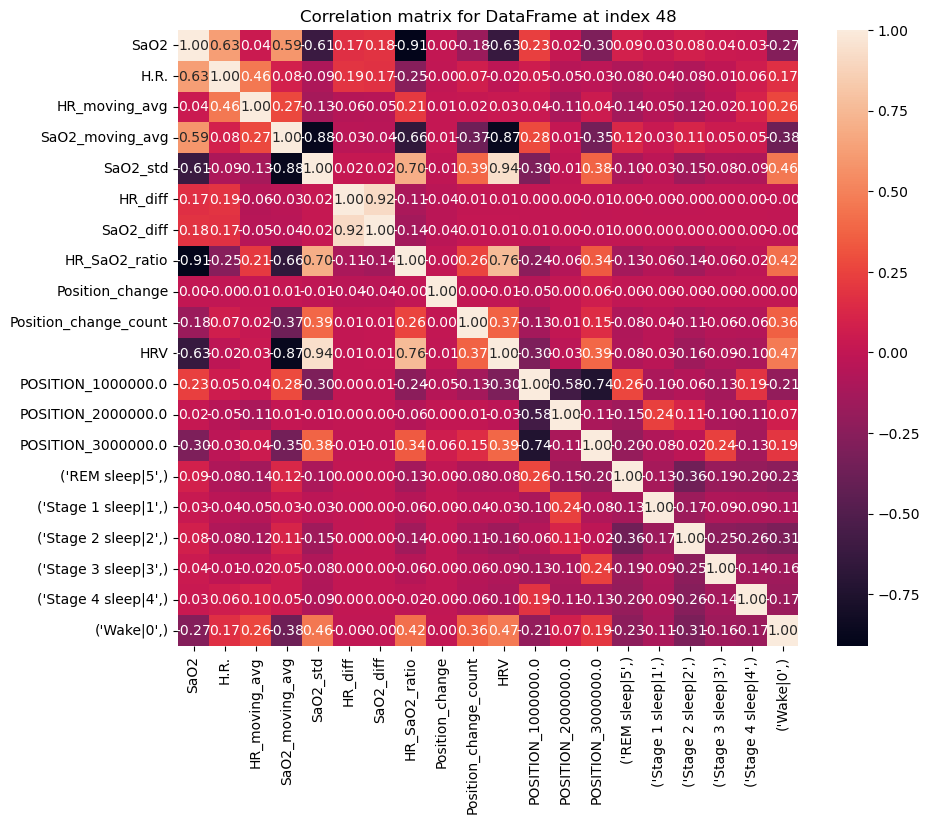

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


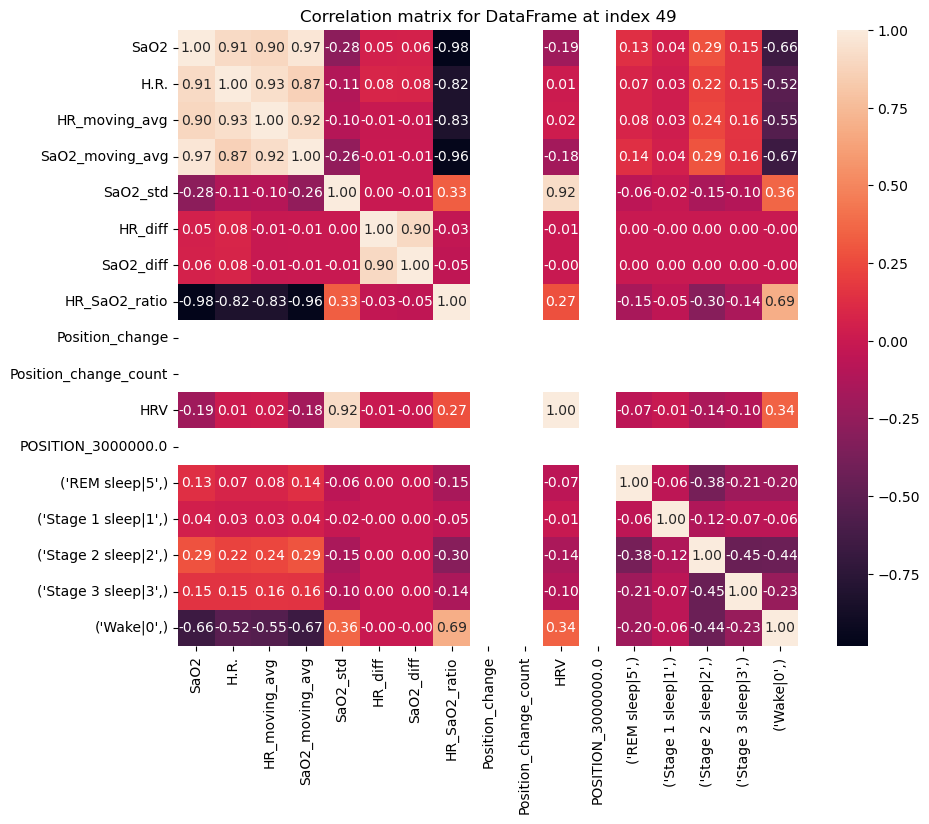

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


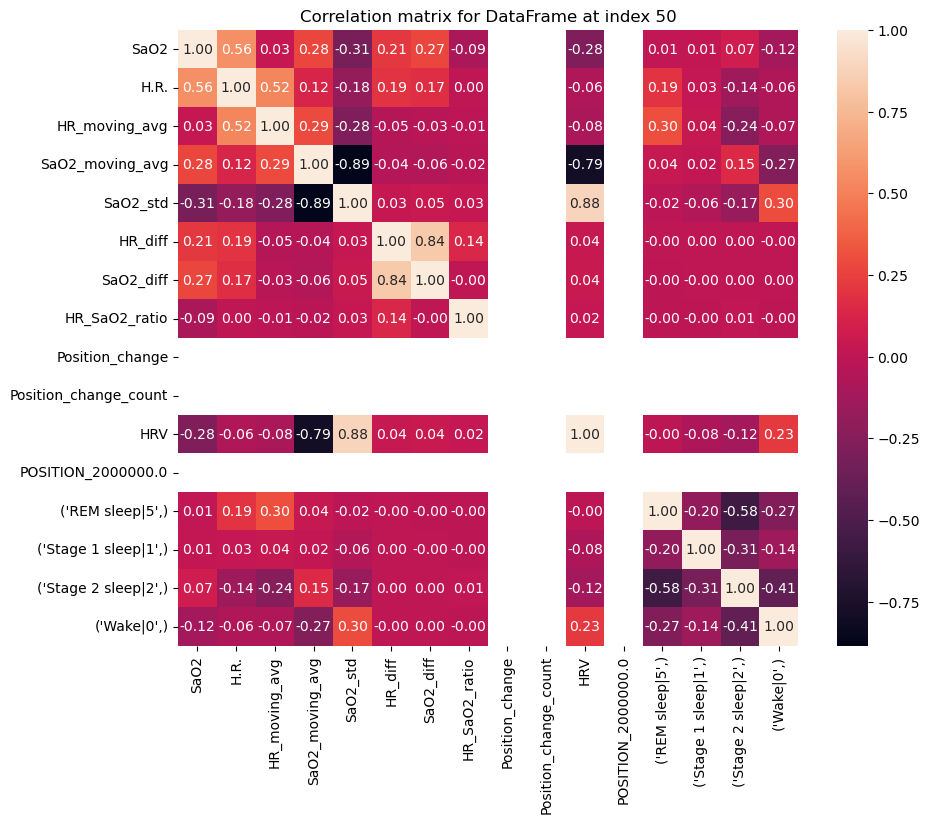

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


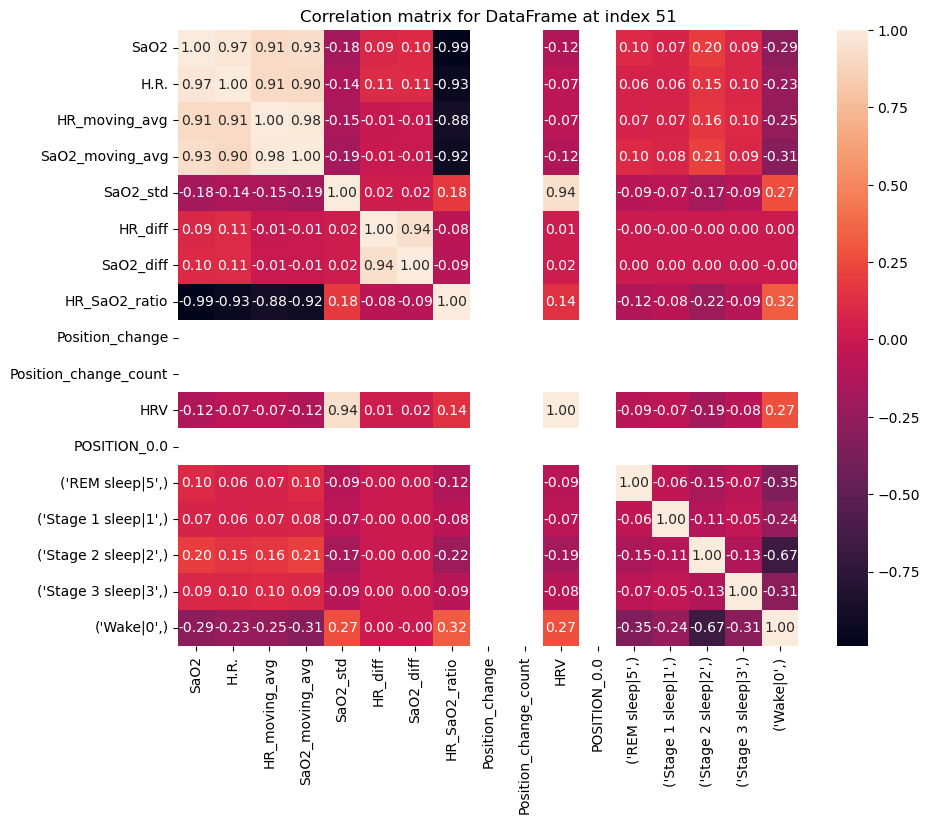

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


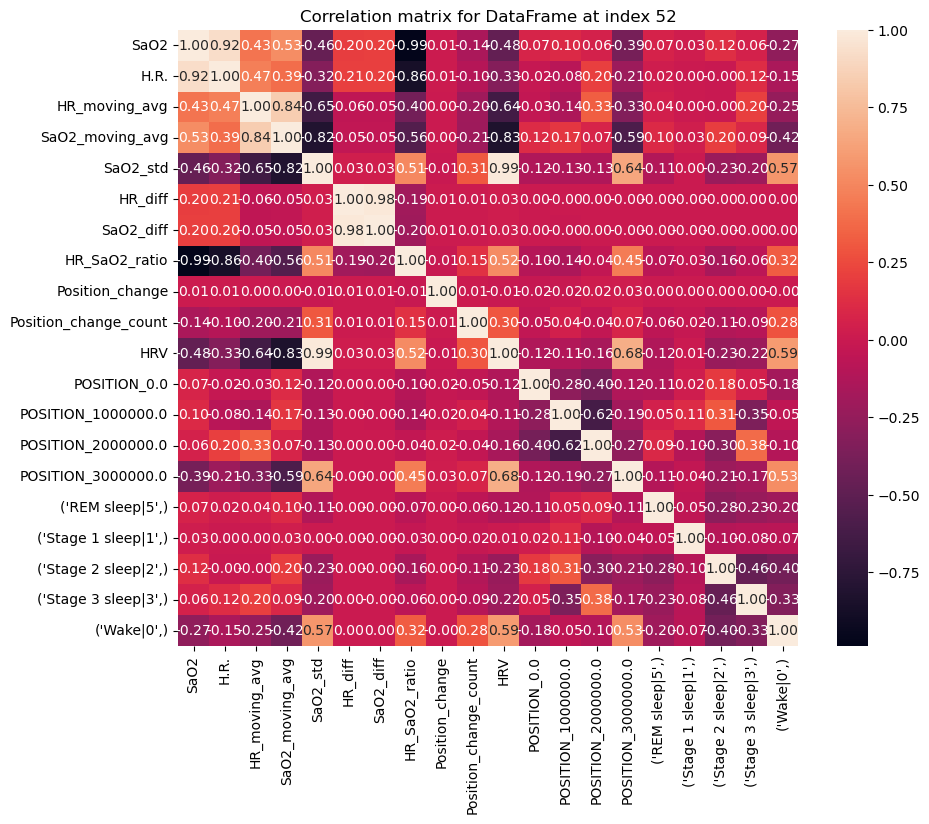

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


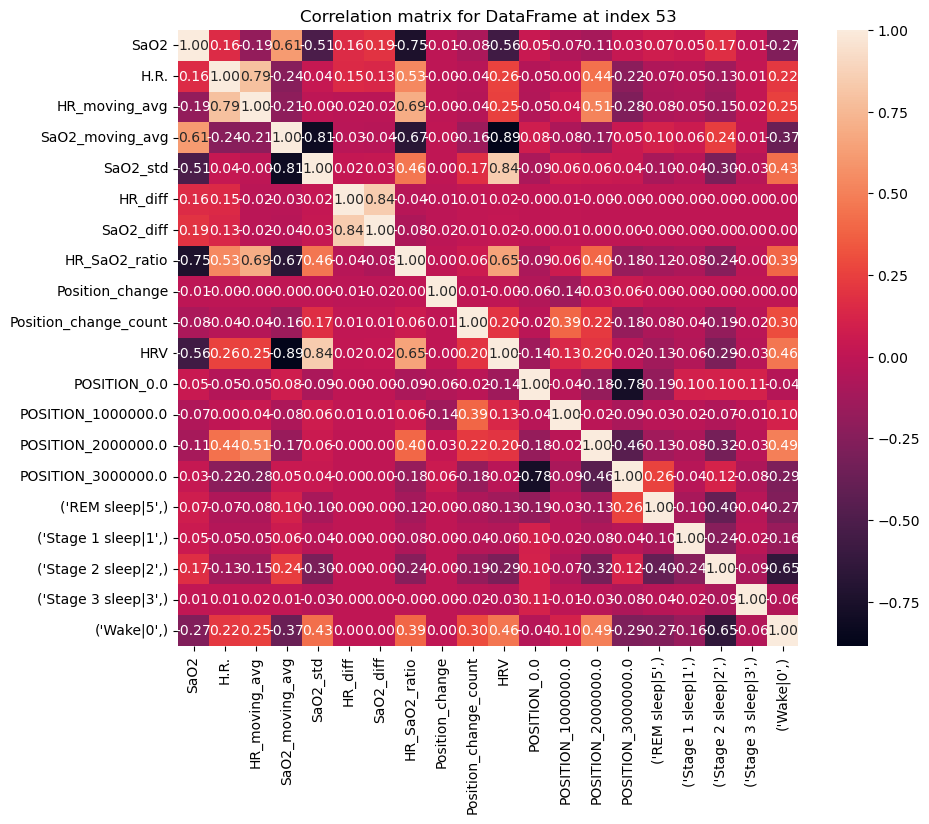

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2619504573.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


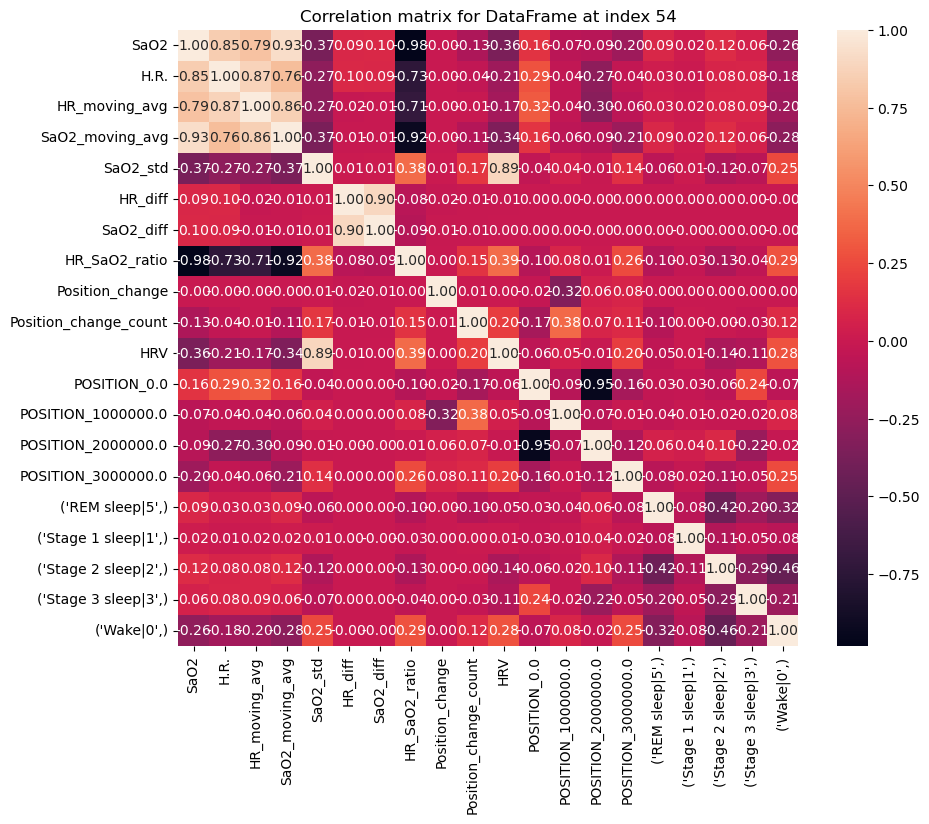

In [229]:
# Make a deep copy of the original list of DataFrames
resampled_df_list_copy = copy.deepcopy(resampled_df_list)

# Initiate OneHotEncoder
one_hot_encoder = OneHotEncoder(sparse=False)

# Start a for loop to iterate through each DataFrame in the list
for i, df in enumerate(resampled_df_list_copy):
    
    # reshape label column to fit the encoder
    labels_reshaped = df['label'].values.reshape(-1, 1)
    
    # fit and transform the label column with OneHotEncoder
    one_hot_encoded_labels = one_hot_encoder.fit_transform(labels_reshaped)
    
    # get the names of the labels
    label_names = one_hot_encoder.categories_
    
    # Convert the one hot encoded labels back to a DataFrame
    one_hot_encoded_labels_df = pd.DataFrame(one_hot_encoded_labels, columns=label_names)
    
    # Drop original label column
    df.drop('label', axis=1, inplace=True)
    
    # Add one hot encoded labels to the original DataFrame
    df = pd.concat([df, one_hot_encoded_labels_df], axis=1)
    
    # Re-calculate the correlation matrix
    corr_matrix = df.corr()
    
    # Visualize the correlation matrix using a heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(corr_matrix, annot=True, fmt=".2f")
    plt.title(f'Correlation matrix for DataFrame at index {i}')
    plt.show()

In [237]:
for i, df in enumerate(resampled_df_list):
    # Subtract the first time in the 'time' column from the entire 'time' column to get a timedelta
    time_diff = df['time'] - df['time'].iloc[0]
    
    # Convert the timedelta to seconds, and convert the result to integer
    df['time'] = time_diff.dt.total_seconds().astype(int)
    
    # Replace the original DataFrame in the list with the new DataFrame
    resampled_df_list[i] = df

In [239]:
for i, df in enumerate(resampled_df_list):
    # Replace inf and -inf with np.nan
    df.replace([np.inf, -np.inf], np.nan, inplace=True)

    # Fill NaN values with the mean of the column
    df.fillna(df.mean(), inplace=True)

    # Continue with your preprocessing...

/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2749604272.py:6: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.fillna(df.mean(), inplace=True)
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2749604272.py:6: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.fillna(df.mean(), inplace=True)
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2749604272.py:6: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False.

/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2749604272.py:6: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.fillna(df.mean(), inplace=True)
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2749604272.py:6: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.fillna(df.mean(), inplace=True)
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2749604272.py:6: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False.

/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2749604272.py:6: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.fillna(df.mean(), inplace=True)
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2749604272.py:6: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.fillna(df.mean(), inplace=True)
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/2749604272.py:6: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False.

In [243]:
for i, df in enumerate(resampled_df_list):
    # Drop the 'time' column
    df = df.drop(columns=['time'])

    # Remove the bottom 60 and top 60 rows
    df = df.iloc[60:-60]

    # Reset the index
    df = df.reset_index(drop=True)
    
    # Replace the original DataFrame in the list with the new DataFrame
    resampled_df_list[i] = df

In [253]:
# Create a new list to hold the processed DataFrames
processed_df_list = []

# Start a for loop to iterate through each DataFrame in the list
for df in resampled_df_list:
    # Create a new instance of StandardScaler for each DataFrame
    scaler = StandardScaler()

    # Separate the features from the labels
    features = df.drop('label', axis=1)
    labels = df['label']
    
    # Fit and transform the features using StandardScaler
    standardized_features = scaler.fit_transform(features)
    
    # Convert the standardized features back to a DataFrame
    standardized_features_df = pd.DataFrame(standardized_features, columns=features.columns)
    
    # Concatenate the standardized features with the labels
    df_processed = pd.concat([standardized_features_df, labels], axis=1)
    
    # Add the processed DataFrame to the new list
    processed_df_list.append(df_processed)


In [272]:
# First, let's find out the complete set of columns
all_columns = set()

for df in processed_df_list:
    all_columns = all_columns.union(set(df.columns))

all_columns = sorted(list(all_columns))  # Sorting the columns

# Now, let's add missing columns to each dataframe and sort them
for i in range(len(processed_df_list)):
    missing_columns = set(all_columns).difference(set(processed_df_list[i].columns))
    
    for column in missing_columns:
        processed_df_list[i][column] = 0
    
    # Sort the columns to ensure they are in the same order
    processed_df_list[i] = processed_df_list[i][all_columns]

# Verify if all dataframes have the same set of columns
for df in processed_df_list:
    assert set(df.columns) == set(all_columns), "Dataframes have different columns"


In [275]:
le = LabelEncoder()

segment_length = 60  # 60 seconds
segments_list = []
labels_list = []

for df in processed_df_list:
    n_segments = len(df) // segment_length
    trimmed_data = df.iloc[:n_segments * segment_length]
    segmented_data = trimmed_data.values.reshape(n_segments, segment_length, -1)
    X = segmented_data[:, :, :-1]
    y = mode(segmented_data[:, :, -1], axis=1)[0].ravel()  
    segments_list.append(X)
    labels_list.append(y)

X = np.concatenate(segments_list)
y_text = np.concatenate(labels_list)

# Here, we use LabelEncoder to transform text labels to integers
y = le.fit_transform(y_text)

X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)


/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/4273753757.py:12: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  y = mode(segmented_data[:, :, -1], axis=1)[0].ravel()
/var/folders/kb/fxsdzvkd3tn7qtds435g0l880000gn/T/ipykernel_36346/4273753757.py:12: DeprecationWarning: Support for non-numeric arrays has been deprecated as of SciPy 1.9.0 and will be removed in 1.11.0. `pandas.DataFrame.mode` can be used instead, see https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.mode.html.
  y = mode(segmented_data[:, :, -1], axis=1)[0].ravel()


In [276]:
print("Training data shape: ", X_train.shape, y_train.shape)
print("Validation data shape: ", X_val.shape, y_val.shape)
print("Test data shape: ", X_test.shape, y_test.shape)

Training data shape:  (19520, 60, 15) (19520,)
Validation data shape:  (4183, 60, 15) (4183,)
Test data shape:  (4183, 60, 15) (4183,)


In [277]:
print("Unique labels in training data: ", np.unique(y_train))
print("Unique labels in validation data: ", np.unique(y_val))
print("Unique labels in test data: ", np.unique(y_test))

Unique labels in training data:  [0 1 2 3 4 5]
Unique labels in validation data:  [0 1 2 3 4 5]
Unique labels in test data:  [0 1 2 3 4 5]


In [278]:
print("Distribution of labels in training data: ", np.bincount(y_train))
print("Distribution of labels in validation data: ", np.bincount(y_val))
print("Distribution of labels in test data: ", np.bincount(y_test))

Distribution of labels in training data:  [2646  715 7836 2699  306 5318]
Distribution of labels in validation data:  [ 567  153 1679  579   65 1140]
Distribution of labels in test data:  [ 567  154 1679  578   66 1139]


In [279]:
sample_index = 0
print("Features of the first sample: ", X_train[sample_index])
print("Label of the first sample: ", y_train[sample_index])

Features of the first sample:  [[-0.30045754276843045 -0.28592798154603927 -0.09119970399302778
  6.546722656378896e-05 -0.6957624253020747 -0.07876635190020499
  -0.08477877619284094 -0.016785991556614793 0.11734897994572134 0.0
  -0.21043333061477373 -0.2934787372439934 -2.2545651307733966e-19
  -0.3412963569201148 -0.15095275722524795]
 [-0.30045754276843045 -0.29552082520878503 -0.09119970399302778
  6.546722656378896e-05 -0.7059371928969862 -0.07876635190020499
  -0.08477877619284094 -0.016785991556614793 0.11734897994572134 0.0
  -0.21043333061477373 -0.2934787372439934 -2.2545651307733966e-19
  -0.34839740166497574 -0.15058728808148533]
 [-0.30045754276843045 -0.3060972858630964 -0.09119970399302778
  6.546722656378896e-05 -0.7161119604918975 -0.07876635190020499
  -0.08477877619284094 -0.016785991556614793 0.11734897994572134 0.0
  -0.21043333061477373 -0.2934787372439934 -2.2545651307733966e-19
  -0.35549844640982037 -0.15036849592816817]
 [-0.30045754276843045 -0.317918561938

In [280]:
print("Original text label of the first sample: ", le.inverse_transform([y_train[sample_index]]))

Original text label of the first sample:  ['Stage 2 sleep|2']


In [281]:
# Map the old labels to the new labels
label_mapping = {0: 0, 1: 1, 2: 1, 3: 2, 4: 2, 5: 3}

# Apply the mapping to the labels
y_train = np.vectorize(label_mapping.get)(y_train)
y_val = np.vectorize(label_mapping.get)(y_val)
y_test = np.vectorize(label_mapping.get)(y_test)

In [282]:
X_val = np.concatenate((X_val, X_test))
y_val = np.concatenate((y_val, y_test))

In [283]:
print("Training data shape: ", X_train.shape, y_train.shape)
print("Validation data shape: ", X_val.shape, y_val.shape)

print("\nUnique labels in training data: ", np.unique(y_train))
print("Unique labels in validation data: ", np.unique(y_val))

print("\nDistribution of labels in training data: ", np.bincount(y_train))
print("Distribution of labels in validation data: ", np.bincount(y_val))

Training data shape:  (19520, 60, 15) (19520,)
Validation data shape:  (8366, 60, 15) (8366,)

Unique labels in training data:  [0 1 2 3]
Unique labels in validation data:  [0 1 2 3]

Distribution of labels in training data:  [2646 8551 3005 5318]
Distribution of labels in validation data:  [1134 3665 1288 2279]


In [285]:
X_train = X_train.astype('float32')
y_train = y_train.astype('float32')
X_val = X_val.astype('float32')
y_val = y_val.astype('float32')

In [290]:
feature_names = list(df.columns[:-1])  # Assumes the label is the last column
feature_names

['H.R.',
 'HRV',
 'HR_SaO2_ratio',
 'HR_diff',
 'HR_moving_avg',
 'POSITION_0.0',
 'POSITION_1000000.0',
 'POSITION_2000000.0',
 'POSITION_3000000.0',
 'Position_change',
 'Position_change_count',
 'SaO2',
 'SaO2_diff',
 'SaO2_moving_avg',
 'SaO2_std']

In [297]:
X_train[:1, :1, ]

array([[[-3.0045754e-01, -2.8592798e-01, -9.1199704e-02,  6.5467226e-05,
         -6.9576240e-01, -7.8766353e-02, -8.4778778e-02, -1.6785992e-02,
          1.1734898e-01,  0.0000000e+00, -2.1043333e-01, -2.9347873e-01,
         -2.2545650e-19, -3.4129634e-01, -1.5095276e-01]]], dtype=float32)

In [301]:
import torch
import torch.nn as nn
import torch.optim as optim

/Users/wilsonbeckman/anaconda3/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [302]:
X_train_torch = torch.tensor(X_train, dtype=torch.float32)
y_train_torch = torch.tensor(y_train, dtype=torch.long)  # for classification task
X_val_torch = torch.tensor(X_val, dtype=torch.float32)
y_val_torch = torch.tensor(y_val, dtype=torch.long)

In [303]:
class LSTMModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(LSTMModel, self).__init__()
        self.hidden_dim = hidden_dim
        self.lstm = nn.LSTM(input_dim, hidden_dim, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        lstm_out, _ = self.lstm(x)
        out = self.fc(lstm_out[:, -1, :])
        return out

In [304]:
n_features = X_train_torch.shape[-1]
n_classes = len(torch.unique(y_train_torch))

model = LSTMModel(n_features, 50, n_classes)  # 50 is the number of LSTM hidden units
criterion = nn.CrossEntropyLoss()  # for classification task
optimizer = optim.Adam(model.parameters())

In [305]:
n_epochs = 10

for epoch in range(n_epochs):
    model.train()
    optimizer.zero_grad()
    output = model(X_train_torch)
    loss = criterion(output, y_train_torch)
    loss.backward()
    optimizer.step()

    if epoch % 2 == 0:  # Print loss every 2 epochs
        print(f'Epoch: {epoch+1}, Loss: {loss.item()}')

Epoch: 1, Loss: 1.3772600889205933
Epoch: 3, Loss: 1.3634198904037476
Epoch: 5, Loss: 1.3499414920806885
Epoch: 7, Loss: 1.336661458015442
Epoch: 9, Loss: 1.3234299421310425


In [306]:
model.eval()
with torch.no_grad():
    output = model(X_val_torch)
    loss = criterion(output, y_val_torch)
    print(f'Validation Loss: {loss.item()}')

Validation Loss: 1.3116756677627563


In [307]:
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

              precision    recall  f1-score   support

           0       0.00      0.00      0.00      1134
           1       0.48      0.97      0.64      3665
           2       0.12      0.01      0.01      1288
           3       0.84      0.30      0.44      2279

    accuracy                           0.51      8366
   macro avg       0.36      0.32      0.27      8366
weighted avg       0.46      0.51      0.40      8366



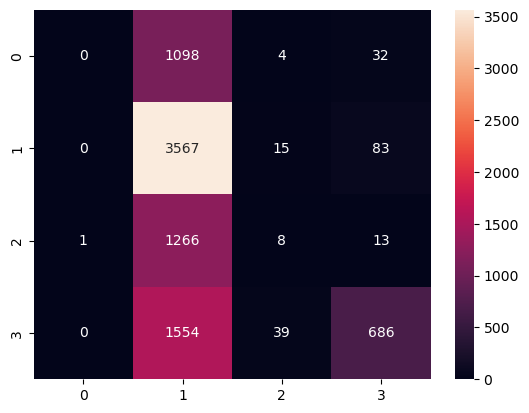

In [308]:
# Get predicted classes
model.eval()
with torch.no_grad():
    outputs = model(X_val_torch)
    _, predicted = torch.max(outputs, 1)

# Create confusion matrix
cm = confusion_matrix(y_val_torch.numpy(), predicted.numpy())
sns.heatmap(cm, annot=True, fmt='d')

# Print classification report
print(classification_report(y_val_torch.numpy(), predicted.numpy()))

In [330]:
class DilatedConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, dilation):
        super(DilatedConvBlock, self).__init__()
        self.conv1 = nn.Conv1d(in_channels, out_channels, kernel_size=3, padding=dilation, dilation=dilation)
        self.conv2 = nn.Conv1d(out_channels, out_channels, kernel_size=3, padding=dilation, dilation=dilation)
        self.dropout = nn.Dropout(0.5)
        self.relu = nn.LeakyReLU(0.2)

    def forward(self, x):
        residual = x
        out = self.relu(self.conv1(x))
        out = self.dropout(out)
        out = self.conv2(out)
        out += residual  # Residual connection
        out = self.relu(out)
        return out

class SimpleSleepStageClassifier(nn.Module):
    def __init__(self, num_channels, num_classes):
        super(SimpleSleepStageClassifier, self).__init__()
        self.conv1 = nn.Conv1d(num_channels, 64, kernel_size=3, stride=1, padding=1)
        self.maxpool = nn.MaxPool1d(kernel_size=2, stride=2)
        self.fc1 = nn.Linear(64*30, 128)  # Based on the maxpool output size
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(128, num_classes)  # Output layer

    def forward(self, x):
        x = self.conv1(x)
        x = self.maxpool(x)
        x = x.view(x.size(0), -1)  # Flatten the tensor
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        return x

In [334]:
# Convert your numpy arrays to PyTorch tensors
X_train_tensor = torch.tensor(X_train).float()
y_train_tensor = torch.tensor(y_train).long()
X_val_tensor = torch.tensor(X_val).float()
y_val_tensor = torch.tensor(y_val).long()

# Create TensorDatasets and DataLoaders for more efficient batch processing
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
val_dataset = TensorDataset(X_val_tensor, y_val_tensor)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32)

# Define the model
model = SimpleSleepStageClassifier(num_channels=15, num_classes=5)

# Define the loss function and the optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Number of epochs
num_epochs = 10

# Train the model
for epoch in range(num_epochs):
    running_loss = 0.0
    for i, (inputs, labels) in enumerate(train_loader, 0):
        # reshape the input to [batch_size, num_channels, sequence_length]
        inputs = inputs.permute(0, 2, 1)
        
        # Forward pass
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        
        # Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
    # Print loss for this epoch   
    print('Epoch [{}/{}], Loss: {:.4f}'.format(epoch+1, num_epochs, running_loss / i))

print('Finished Training')

# Now for the evaluation part
correct = 0
total = 0

with torch.no_grad():
    for inputs, labels in val_loader:
        # reshape the input to [batch_size, num_channels, sequence_length]
        inputs = inputs.permute(0, 2, 1)
        
        outputs = model(inputs)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Accuracy of the network on the test inputs: %d %%' % (
    100 * correct / total))

Epoch [1/10], Loss: 1.0816
Epoch [2/10], Loss: 1.0214
Epoch [3/10], Loss: 0.9918
Epoch [4/10], Loss: 0.9649
Epoch [5/10], Loss: 0.9390
Epoch [6/10], Loss: 0.9009
Epoch [7/10], Loss: 0.8764
Epoch [8/10], Loss: 0.8526
Epoch [9/10], Loss: 0.8249
Epoch [10/10], Loss: 0.8009
Finished Training
Accuracy of the network on the test inputs: 62 %


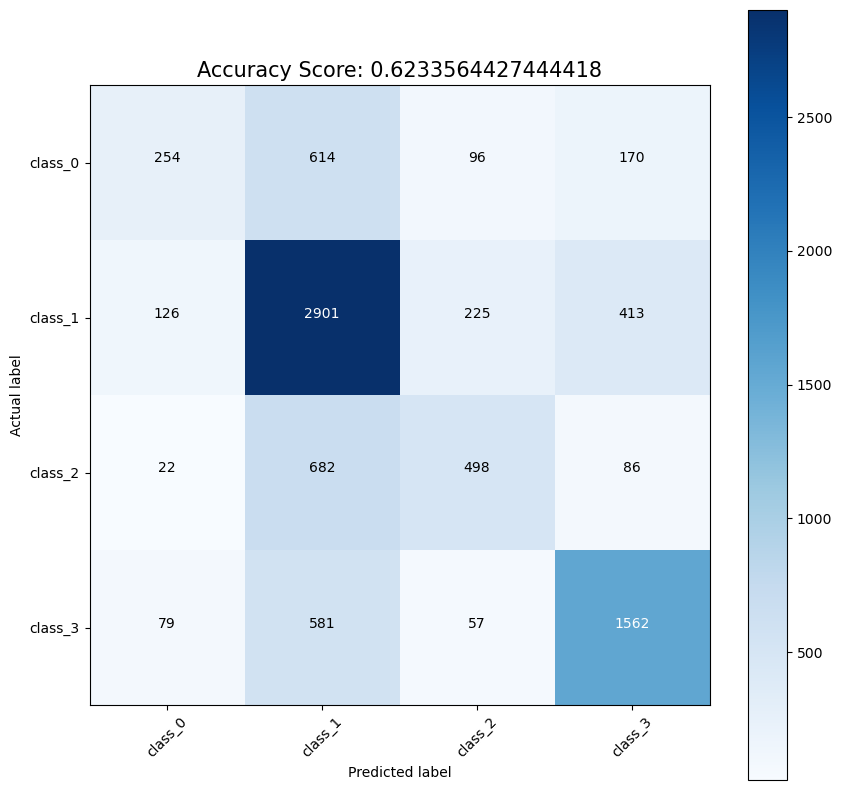

In [337]:
from sklearn.metrics import confusion_matrix
import itertools 

def evaluate_model(model, val_loader):
    model.eval()  # set the model to evaluation mode
    all_labels = []
    all_preds = []
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, labels in val_loader:
            # reshape the input to [batch_size, num_channels, sequence_length]
            inputs = inputs.permute(0, 2, 1)
            outputs = model(inputs)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_labels.extend(labels.numpy())
            all_preds.extend(predicted.numpy())

    score = correct / total
    return all_labels, all_preds, score


def plot_confusion_matrix(cm, classes, score):
    plt.figure(figsize=(10,10))
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > cm.max() / 2. else "black")
    
    plt.ylabel('Actual label')
    plt.xlabel('Predicted label')
    all_sample_title = 'Accuracy Score: {0}'.format(score)
    plt.title(all_sample_title, size = 15)
    plt.show()

# After training the model, we evaluate it on the test set
all_labels, all_preds, score = evaluate_model(model, val_loader)
cf_matrix = confusion_matrix(all_labels, all_preds)

# Plot the confusion matrix
class_names = ['class_0', 'class_1', 'class_2', 'class_3']  # Replace with your class names
plot_confusion_matrix(cf_matrix, classes=class_names, score=score)

In [338]:
# Index of features to be removed
features_to_remove_indices = [2, 3, 4, 5, 6, 7, 8, 9, 12, 13, 14]

# Remove these features from the training set
X_train = np.delete(X_train, features_to_remove_indices, axis=2)

# Remove these features from the validation set
X_val = np.delete(X_val, features_to_remove_indices, axis=2)

In [348]:
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()

        # Defining layers 
        self.conv1 = nn.Conv1d(in_channels=1, out_channels=32, kernel_size=3)
        self.pool1 = nn.MaxPool1d(kernel_size=2)
        self.lstm1 = nn.LSTM(input_size=32, hidden_size=32, batch_first=True)

        self.conv2 = nn.Conv1d(in_channels=1, out_channels=32, kernel_size=3)
        self.pool2 = nn.MaxPool1d(kernel_size=2)
        self.lstm2 = nn.LSTM(input_size=32, hidden_size=32, batch_first=True)

        self.conv3 = nn.Conv1d(in_channels=1, out_channels=32, kernel_size=3)
        self.pool3 = nn.MaxPool1d(kernel_size=2)
        self.lstm3 = nn.LSTM(input_size=32, hidden_size=32, batch_first=True)

        self.conv4 = nn.Conv1d(in_channels=1, out_channels=32, kernel_size=3)
        self.pool4 = nn.MaxPool1d(kernel_size=2)
        self.lstm4 = nn.LSTM(input_size=32, hidden_size=32, batch_first=True)

        # Final linear layers
        self.fc1 = nn.Linear(4*32, 128)
        self.fc2 = nn.Linear(128, 64)
        self.fc3 = nn.Linear(64, 4)  # Four output classes

    def forward(self, x):
        # Splitting the input into separate channels
        x1 = x[:, :, 0].unsqueeze(1)
        x2 = x[:, :, 1].unsqueeze(1)
        x3 = x[:, :, 2].unsqueeze(1)
        x4 = x[:, :, 3].unsqueeze(1)

        # First channel
        x1 = self.conv1(x1)
        x1 = self.pool1(x1)
        x1 = x1.transpose(1, 2)
        x1, _ = self.lstm1(x1)
        x1 = x1[:, -1, :]

        # Second channel
        x2 = self.conv2(x2)
        x2 = self.pool2(x2)
        x2 = x2.transpose(1, 2)
        x2, _ = self.lstm2(x2)
        x2 = x2[:, -1, :]

        # Third channel
        x3 = self.conv3(x3)
        x3 = self.pool3(x3)
        x3 = x3.transpose(1, 2)
        x3, _ = self.lstm3(x3)
        x3 = x3[:, -1, :]

        # Fourth channel
        x4 = self.conv4(x4)
        x4 = self.pool4(x4)
        x4 = x4.transpose(1, 2)
        x4, _ = self.lstm4(x4)
        x4 = x4[:, -1, :]

        # Concatenating the last hidden states of the LSTM layers
        x = torch.cat((x1, x2, x3, x4), dim=1)

        # Passing the concatenated tensor through the dense layers
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)

        return x

In [349]:
# Defining the model
model = Net()

# Defining the loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Number of epochs
epochs = 25

# Batch size - you might need to adjust this depending on your memory availability
batch_size = 32

# Convert your data to PyTorch tensors
X_train_tensor = torch.tensor(X_train).float()
y_train_tensor = torch.tensor(y_train).long()

X_val_tensor = torch.tensor(X_val).float()
y_val_tensor = torch.tensor(y_val).long()

for epoch in range(epochs):
    for i in range(0, len(X_train), batch_size):
        # Get the batch
        inputs = X_train_tensor[i:i+batch_size]
        labels = y_train_tensor[i:i+batch_size]

        # Zero the parameter gradients
        optimizer.zero_grad()

        # Forward pass
        outputs = model(inputs)
        loss = criterion(outputs, labels)

        # Backward pass and optimization
        loss.backward()
        optimizer.step()

    # Print loss after each epoch
    print(f'Epoch {epoch+1}, Loss: {loss.item()}')

# After training, you can evaluate the model's performance on the validation set.
model.eval()  # Set the model to evaluation mode

with torch.no_grad():
    outputs = model(X_val_tensor)
    _, predicted = torch.max(outputs.data, 1)
    correct = (predicted == y_val_tensor).sum().item()
    accuracy = correct / len(y_val)
    print(f'Accuracy of the model on the validation data: {accuracy * 100}%'

Epoch 1, Loss: 0.9788873195648193
Epoch 2, Loss: 0.9279578924179077
Epoch 3, Loss: 0.9322848320007324
Epoch 4, Loss: 0.9248782396316528
Epoch 5, Loss: 0.9061990976333618
Epoch 6, Loss: 0.8951801657676697
Epoch 7, Loss: 0.8400961756706238
Epoch 8, Loss: 0.8231128454208374
Epoch 9, Loss: 0.8055830597877502
Epoch 10, Loss: 0.8111630082130432
Epoch 11, Loss: 0.8276904821395874
Epoch 12, Loss: 0.8145845532417297
Epoch 13, Loss: 0.8077184557914734
Epoch 14, Loss: 0.7677449584007263
Epoch 15, Loss: 0.7747716307640076
Epoch 16, Loss: 0.7615690231323242
Epoch 17, Loss: 0.7208054065704346
Epoch 18, Loss: 0.7136099338531494
Epoch 19, Loss: 0.6761778593063354
Epoch 20, Loss: 0.6747668981552124
Epoch 21, Loss: 0.5983739495277405
Epoch 22, Loss: 0.6440085768699646
Epoch 23, Loss: 0.5942481756210327
Epoch 24, Loss: 0.6405037045478821
Epoch 25, Loss: 0.553521454334259
Accuracy of the model on the validation data: 66.01721252689458%


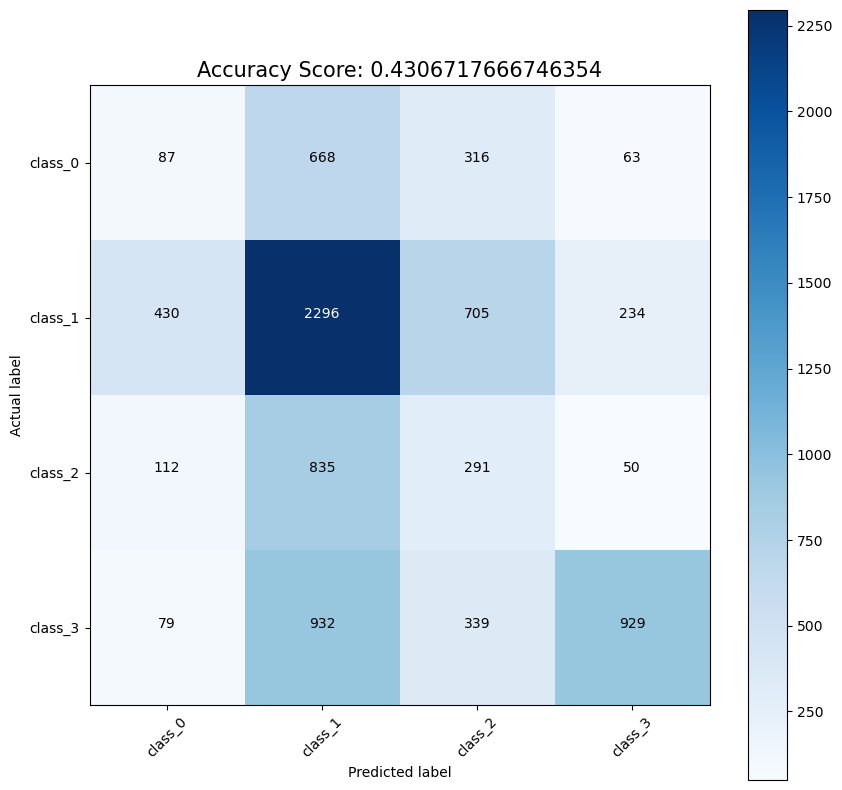

In [352]:
def evaluate_model(model, val_loader):
    model.eval()  # set the model to evaluation mode
    all_labels = []
    all_preds = []
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, labels in val_loader:
            # reshape the input to [batch_size, num_channels, sequence_length]
            inputs = inputs.permute(0, 2, 1)
            outputs = model(inputs)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_labels.extend(labels.numpy())
            all_preds.extend(predicted.numpy())

    score = correct / total
    return all_labels, all_preds, score


def plot_confusion_matrix(cm, classes, score):
    plt.figure(figsize=(10,10))
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > cm.max() / 2. else "black")
    
    plt.ylabel('Actual label')
    plt.xlabel('Predicted label')
    all_sample_title = 'Accuracy Score: {0}'.format(score)
    plt.title(all_sample_title, size = 15)
    plt.show()

# After training the model, we evaluate it on the test set
all_labels, all_preds, score = evaluate_model(model, val_loader)
cf_matrix = confusion_matrix(all_labels, all_preds)

# Plot the confusion matrix
class_names = ['class_0', 'class_1', 'class_2', 'class_3']  # Replace with your class names
plot_confusion_matrix(cf_matrix, classes=class_names, score=score)

Adjustments I can make to the model:

1. Even Labels
2. Add Back Features
3. More Data
4. Combine Nature.com model and 4-input model
5. Transformer model
6. Hyperparameter adjustments
7. More Epochs
8. Larger Model